# **Project Name**    - **Netflix Movies and TV Shows Clustering**



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual
##### **Team Member 1 - Anjali Patel**


# **Project Summary -**

The entertainment industry is fiercely competitive, with success hinging on multiple factors such as genre, rating, production budget, cast, and more. A comprehensive study was conducted to delve into the elements that impact the appeal of movies and TV shows available on Netflix. The study relied on a dataset containing approximately 12 variables to categorize movies and TV shows based on their popularity and viewer preferences.

To kickstart the analysis, data cleansing was carried out. This involved addressing missing data points and assessing unique values. The study identified 2389 missing entries for the 'director' column, 718 for 'cast,' 507 for 'country,' and 10 for 'date_added.' These gaps were addressed by removing the corresponding rows.

Subsequently, exploratory data analysis (EDA) was undertaken. Netflix boasts a larger catalog of movies compared to TV shows, with 5372 movies and 2398 TV shows currently accessible on the platform. The most prevalent content rating for TV shows is TV-MA, indicating a significant presence of mature-themed TV shows on Netflix. Interestingly, TV-MA is also the most common rating for both movies and TV shows, suggesting that Netflix predominantly caters to an adult audience, focusing on mature and potentially controversial content.

The years 2017 and 2018 witnessed the highest number of movie releases, while 2020 marked the peak for TV show releases. Notably, the rate of growth in movie releases on Netflix outpaces that of TV shows. Since 2015, there has been a substantial uptick in the number of movies and TV show episodes available on Netflix. However, there is a discernible decline in movie and TV show production after 2020, indicating a shift in Netflix's focus towards expanding its movie library over TV shows.

A countplot analysis reveals that Netflix tends to add the most movies and TV shows between October and January, making this period the busiest in terms of content updates. The United States leads in terms of content offerings on Netflix, closely followed by India, which boasts the highest number of movies.

To group the shows, the study concentrated on six key attributes: director, cast, country, genre, rating, and description. These attributes underwent a transformation into a 10,000-feature TFIDF vectorization, and Principal Component Analysis (PCA) was used to reduce the components to 3000, capturing over 80% of the variance.

Two clustering algorithms, namely K-Means and Agglomerative clustering, were utilized to cluster the shows. K-Means determined 5 as the optimal number of clusters, while Agglomerative clustering suggested 7 clusters. These clusters were visually represented using a dendrogram.

Finally, a content-based recommender system was developed using a similarity matrix obtained through cosine similarity. This system furnishes personalized recommendations based on the user's viewing history, presenting them with 10 top-tier suggestions to explore.

In summary, this study unveiled significant trends in the Netflix dataset, including the contrasting growth rates of movies and TV shows, the busiest period for content additions, and the content demographics. Through clustering and a content-based recommender system, personalized viewing recommendations rooted in the user's history were generated. This research provides invaluable insights into the factors influencing the popularity of movies and TV shows on Netflix, serving as a foundation for future research and analysis.

# **GitHub Link -**

https://github.com/Newbie810/Unsupervised---Netflix-Movies-and-TV-Shows-Clustering.git

# **Problem Statement**


This dataset contains information about TV shows and movies that were accessible on Netflix as of 2019. The data was gathered from Flixable, a third-party Netflix search engine.

In a report from 2018, it was revealed that the number of TV shows on Netflix had nearly tripled since 2010, while the count of movies available had decreased by more than 2,000 titles during the same period. This dataset presents an opportunity to explore additional insights from this data.

By merging this dataset with external sources such as IMDB ratings and Rotten Tomatoes, we can uncover fascinating information.

In this project, the following tasks are to be undertaken:

1. Conducting Exploratory Data Analysis (EDA).
2. Understanding the types of content available in different countries.
3. Investigating whether Netflix has shifted its focus towards TV shows over movies in recent years.

4. Grouping similar content based on text-based features through clustering.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
# Import Libraries

# Importing the libraries
import numpy as np
import pandas as pd
from numpy import math
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import missingno as msno
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# library used for textual data prerocessing
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from scipy.stats import ttest_ind
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# library used for Clusters impelementation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# library used for building recommandation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Warnings library. Would help to throw away warnings caused.
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Loading Netflix Dataset
# csv file location
csv_file = ('/content/drive/MyDrive/Unsupervised - Netflix Movies and TV Shows Clustering/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

# Reading the data set
data_set = pd.read_csv(csv_file)

# Creating a copy of data set
netflix_data = data_set.copy()

### Dataset First View

In [ ]:
# Dataset First Look
netflix_data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
netflix_data.shape

(7787, 12)

### Dataset Information

In [ ]:
# Dataset Info
netflix_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
# Count the number of duplicate rows in the DataFrame
duplicate_rows = netflix_data[netflix_data.duplicated()]
duplicate_count = len(duplicate_rows)

# Print the result
print("Number of duplicate rows: ", duplicate_count)

Number of duplicate rows:  0


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
netflix_data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

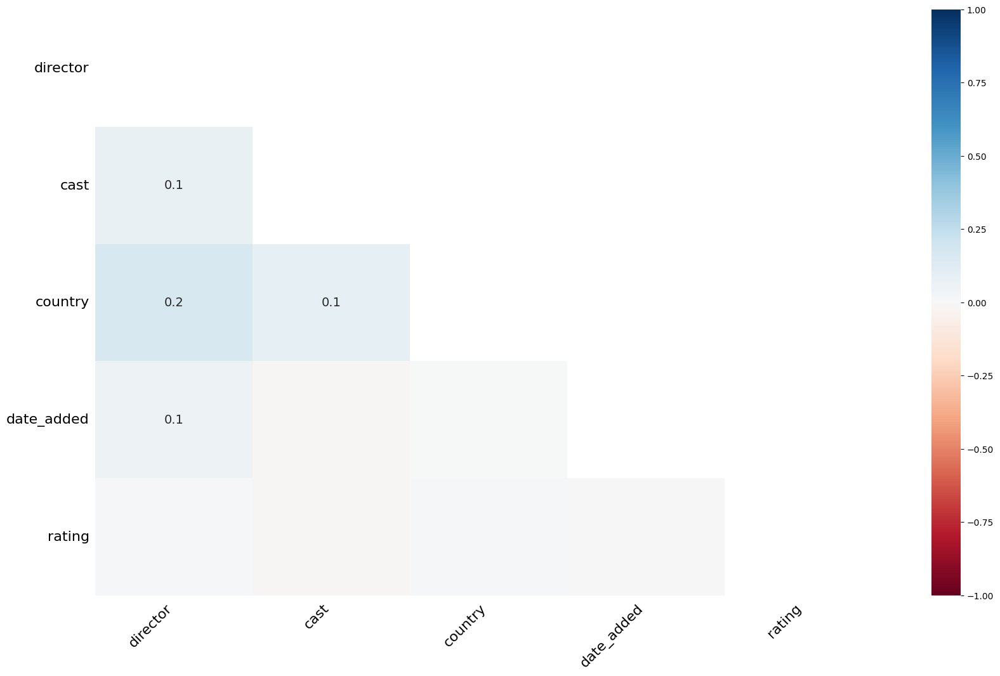

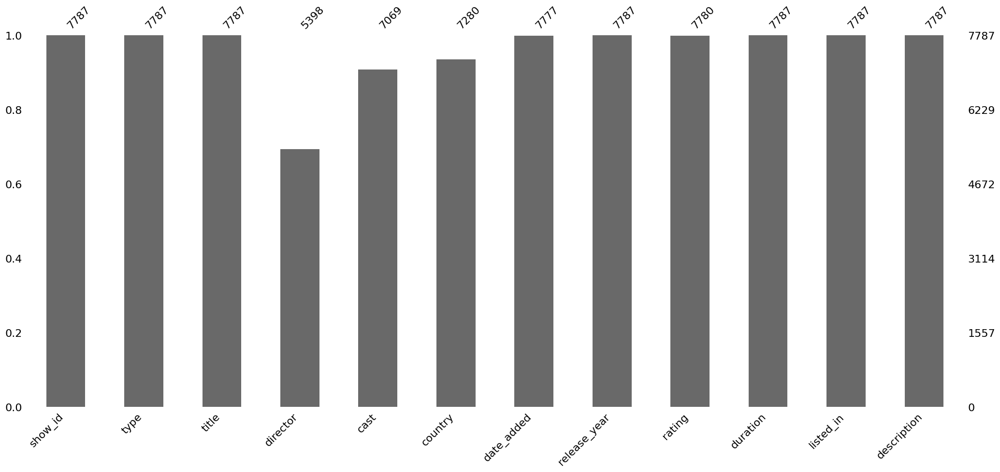

In [ ]:
# Visualizing the missing values
# Visualize missing data with a heatmap
msno.heatmap(netflix_data)
plt.show()

# Visualize missing data with a bar chart
msno.bar(netflix_data)
plt.show()

### What did you know about your dataset?

The dataset comprises 7787 rows and 12 columns, with four of these columns having missing values. In total, there are 3631 missing values within the dataset.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
netflix_data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
netflix_data.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


### Variables Description

1. show_id : Unique ID for every Movie / Tv Show
2. type : Identifier - A Movie or TV Show
3. title : Title of the Movie / Tv Show
4. director : Director of the Movie
5. cast : Actors involved in the movie / show
6. country : Country where the movie / show was produced
7. date_added : Date it was added on Netflix
8. release_year : Actual Releaseyear of the movie / show
9. rating : TV Rating of the movie / show
10. duration : Total Duration - in minutes or number of seasons
11. listed_in : Genere
12. description: The Summary description

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
# Iterate over each column in the DataFrame
for col in netflix_data.columns:
    # Get the unique values for the column
    unique_vals = netflix_data[col].unique()
    # Print the column name and its unique values
    print(col, unique_vals)

show_id ['s1' 's2' 's3' ... 's7785' 's7786' 's7787']
type ['TV Show' 'Movie']
title ['3%' '7:19' '23:59' ... 'Zulu Man in Japan' "Zumbo's Just Desserts"
 "ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS"]
director [nan 'Jorge Michel Grau' 'Gilbert Chan' ... 'Josef Fares' 'Mozez Singh'
 'Sam Dunn']
cast ['João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi'
 'Demián Bichir, Héctor Bonilla, Oscar Serrano, Azalia Ortiz, Octavio Michel, Carmen Beato'
 'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim'
 ...
 'Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanana, Manish Chaudhary, Meghna Malik, Malkeet Rauni, Anita Shabdish, Chittaranjan Tripathy'
 'Nasty C' 'Adriano Zumbo, Rachel Khoo']
country ['Brazil' 'Mexico' 'Singapore' 'United States' 'Turkey' 'Egypt' 'India'
 'Poland, United States' 'Thailand' 'Nigeria' nan
 'Norway, Ice

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Write your code to make your dataset analysis ready.
# Handling Null Values
netflix_data['cast'].fillna(value='No cast',inplace=True)
netflix_data['country'].fillna(value=netflix_data['country'].mode()[0],inplace=True)

In [ ]:
# 'date_added' and 'rating' contains an insignificant portion of the data so we will drop them from the dataset
netflix_data.dropna(subset=['date_added','rating'],inplace=True)

In [ ]:
# Again checking is there any null values are not
netflix_data.isnull().sum()

show_id                 0
type                    0
title                   0
director                0
cast                    0
country                 0
date_added              0
release_year            0
rating                  0
duration                0
listed_in               0
description             0
target_ages             0
month                   0
count                   0
month_added             0
tags                    0
kmeans_cluster          0
hierarchical_cluster    0
dtype: int64

### What all manipulations have you done and insights you found?

Null values in the 'cast' column have been replaced with 'No cast.' Additionally, missing values in the 'country' column have been substituted with the mode of the column. Rows with null values in the 'date_added' and 'rating' columns have been removed. Furthermore, the 'director' column has been dropped from the dataset.

After these data manipulations, potential insights that can be gleaned include:
1.  The predominant country for Netflix content can likely be inferred from the country that filled in the null values for the 'country' column.
2.  The 'cast' column holds significance in the dataset, considering the effort to fill null values to maintain data completeness.
3.  The 'date_added' and 'rating' columns may not hold significant importance in the dataset, given their removal due to a limited number of null values. However, their relevance may vary depending on the specific analysis being conducted.
4.  The decision to drop the 'director' column implies that it may not contribute significantly to the analysis or may have limited relevance.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### **Chart - 1 -Which type of content is available ?**

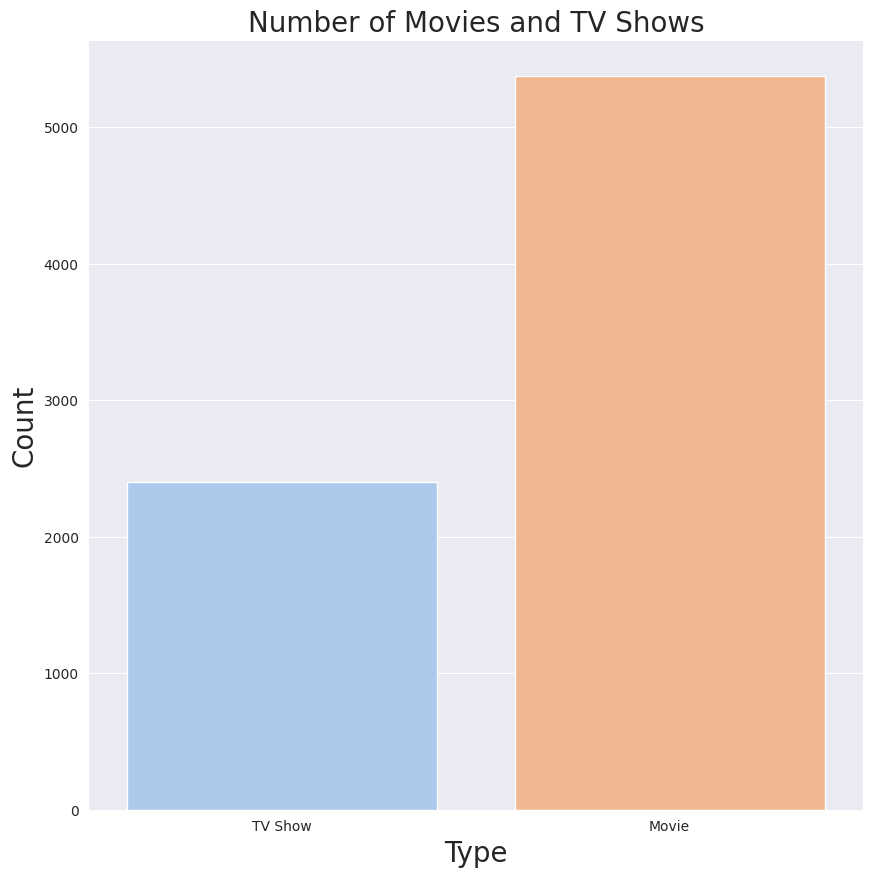

In [ ]:
# Chart - 1 visualization code
sns.set_style('darkgrid')
plt.figure(figsize=(10, 10))
sns.countplot(x='type', data=netflix_data, palette='pastel')
#labeling of values
plt.title('Number of Movies and TV Shows', fontsize=20)
plt.xlabel('Type', fontsize=20)
plt.ylabel('Count', fontsize=20)
#Visualization of number of movies and tv shows
plt.show()

##### 1. Why did you pick the specific chart?

A countplot, which is a variant of a bar chart, is an effective choice for visualizing categorical data, such as the count of movies and TV shows on Netflix. Countplots excel in presenting the frequency of each category in a straightforward and comprehensible manner, making them a valuable tool for data visualization.

##### 2. What is/are the insight(s) found from the chart?

The Netflix offers a larger selection of movies compared to TV shows, with a catalog of 5372 movies and 2398 TV shows currently available on the platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The observation that Netflix has more movies than TV shows, by itself, may not yield significant positive or negative business impacts. However, it serves as a foundational piece of information that can guide more informed decision-making when combined with other insights and data.

For instance, if Netflix discerns from its data that TV shows enjoy greater popularity among subscribers, it might opt to prioritize acquiring more TV show content to meet viewer preferences. Conversely, if original movies produced by Netflix gain traction, the company may choose to allocate more resources to that aspect of its content creation.

Regarding negative growth, the specific observation that Netflix has a larger movie library than TV shows is not inherently detrimental. Yet, if Netflix disregards its subscribers' preferences and continues to emphasize movie acquisitions over TV shows, it could risk losing subscribers seeking more TV content. Furthermore, if Netflix's competitors expand their TV show offerings, failing to respond with a similar strategy could lead to a loss of market share. Therefore, while the observation itself may not be negative, the potential consequences arise from Netflix's strategic decisions and market dynamics.

#### **Chart - 2 - What is the rating of each content ?**

In [ ]:
# Chart - 2 visualization code
netflix_data['rating']

0       TV-MA
1       TV-MA
2           R
3       PG-13
4       PG-13
        ...  
7782    TV-MA
7783    TV-14
7784    TV-MA
7785    TV-PG
7786    TV-MA
Name: rating, Length: 7770, dtype: object

In [ ]:
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
netflix_data['target_ages'] = netflix_data['rating'].map(ratings)

In [ ]:
# Convert 'type' column to categorical data type
netflix_data['type'] = pd.Categorical(netflix_data['type'])

# Create a new categorical column 'target_ages' with specified categories
netflix_data['target_ages'] = pd.Categorical(netflix_data['target_ages'], categories=['Kids', 'Older Kids', 'Teens', 'Adults'])

In [ ]:
netflix_data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens


In [ ]:
# Creating two extra columns
tv_shows = netflix_data[netflix_data['type']=='TV Show']
movies = netflix_data[netflix_data['type']=='Movie']

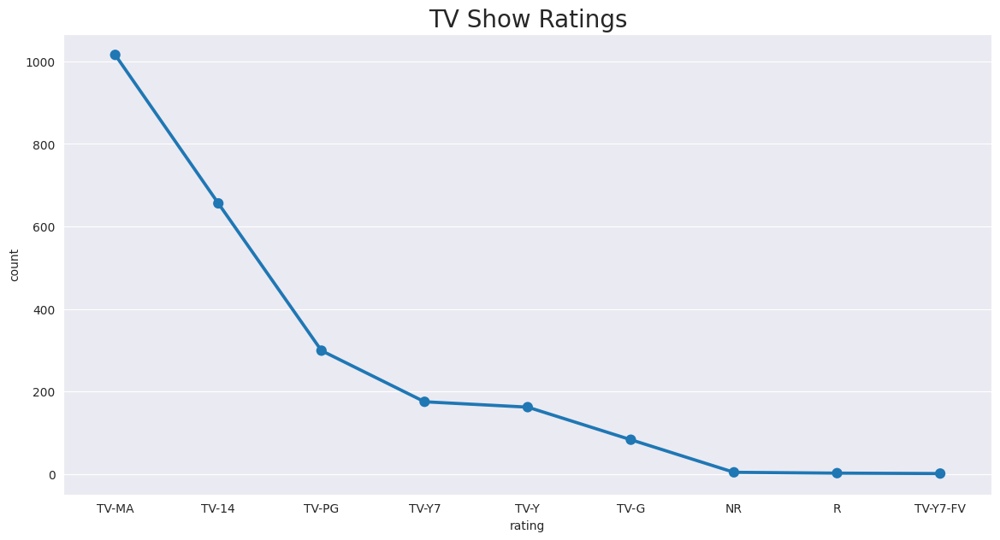

In [ ]:
# Group TV shows by 'rating' and count the number of shows in each rating category
tv_ratings = tv_shows.groupby(['rating'])['show_id'].count().reset_index(name='count').sort_values(by='count',ascending=False)

# Set figure dimensions
fig_dims = (14,7)

# Create a figure and axis object with specified dimensions
fig, ax = plt.subplots(figsize=fig_dims)

# Create a point plot using Seaborn's pointplot() function, with 'rating' on the x-axis and 'count' on the y-axis
sns.pointplot(x='rating',y='count',data=tv_ratings)

# Set the plot title and font size
plt.title('TV Show Ratings',size='20')

# Display the plot
plt.show()


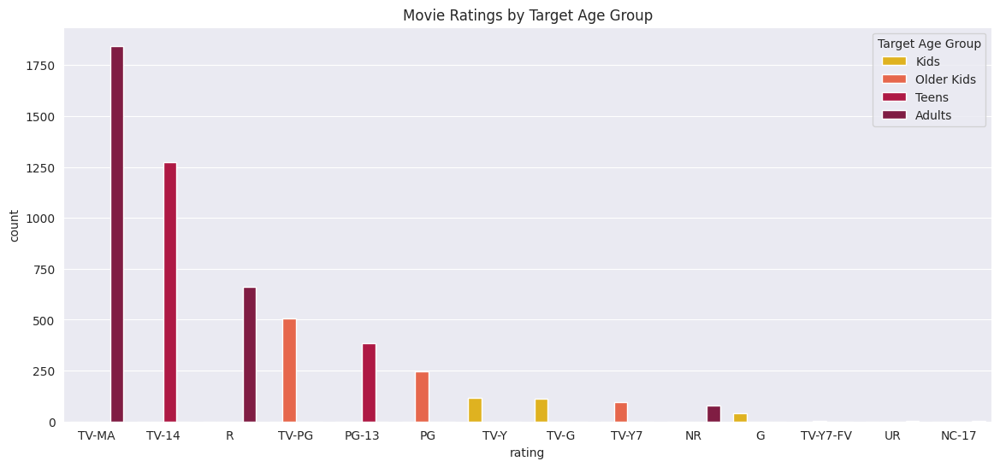

In [ ]:
# Create a color palette for the different target age groups
colors = ["#FFC300", "#FF5733", "#C70039", "#900C3F"]

# Plot a countplot to show the movie ratings based on target age groups
plt.figure(figsize=(14,6))
plt.title('Movie Ratings by Target Age Group')
sns.countplot(x=movies['rating'], hue=movies['target_ages'], data=movies, order=movies['rating'].value_counts().index, palette=colors)

# Add a legend to the plot
plt.legend(title='Target Age Group', loc='upper right', labels=['Kids', 'Older Kids', 'Teens', 'Adults'])
plt.show()

##### 1. Why did you pick the specific chart?

I selected this chart because it provides a succinct and visually informative representation of the distribution of TV show ratings. The use of bars facilitates a straightforward comparison between the various ratings, and the arrangement in descending order by count accentuates the prevalence of TV-MA. In summary, this chart offers a rapid and insightful glimpse into the landscape of TV show ratings on Netflix.

##### 2. What is/are the insight(s) found from the chart?

As per the dataset, the most frequent rating for TV shows is TV-MA, demonstrating that a substantial proportion of the TV shows accessible on Netflix are intended for mature audiences. Interestingly, the dataset also reveals that TV-MA is the most prevalent rating for both movies and TV shows. This finding suggests that Netflix's content library primarily targets an adult demographic, emphasizing mature and potentially contentious subject matter. To elaborate, TV-MA is not only the most frequently occurring rating for TV shows but also maintains its status as the most common rating for movies. This reinforces the notion that Netflix prioritizes content that caters to an adult audience.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights gained from this data analysis can indeed influence Netflix's business strategy in both positive and negative ways.

On the positive side, recognizing that TV-MA is the most common rating for both movies and TV shows enables Netflix to continue its focus on producing and acquiring content that resonates with adult audiences. This strategic alignment can help in attracting and retaining subscribers who are specifically interested in mature and potentially controversial themes. Additionally, understanding the demographics associated with different ratings can aid Netflix in tailoring its marketing and promotional efforts to specific target audiences, enhancing its overall effectiveness.

Conversely, there is a potential negative impact to consider. The prevalence of mature content, especially if it dominates Netflix's offerings, might discourage subscribers seeking family-friendly or more wholesome programming. This could potentially result in a loss of subscribers who are not interested in or comfortable with adult themes, leading to a decline in the subscriber base. To mitigate this, Netflix needs to strike a balance in its content portfolio, ensuring that it appeals to a diverse range of viewers and avoids alienating any particular demographic. Balancing content to cater to different audience segments is crucial for maintaining a broad and engaged subscriber base.

#### **Chart - 3 - What is the release year of Movies and TV shows ?**

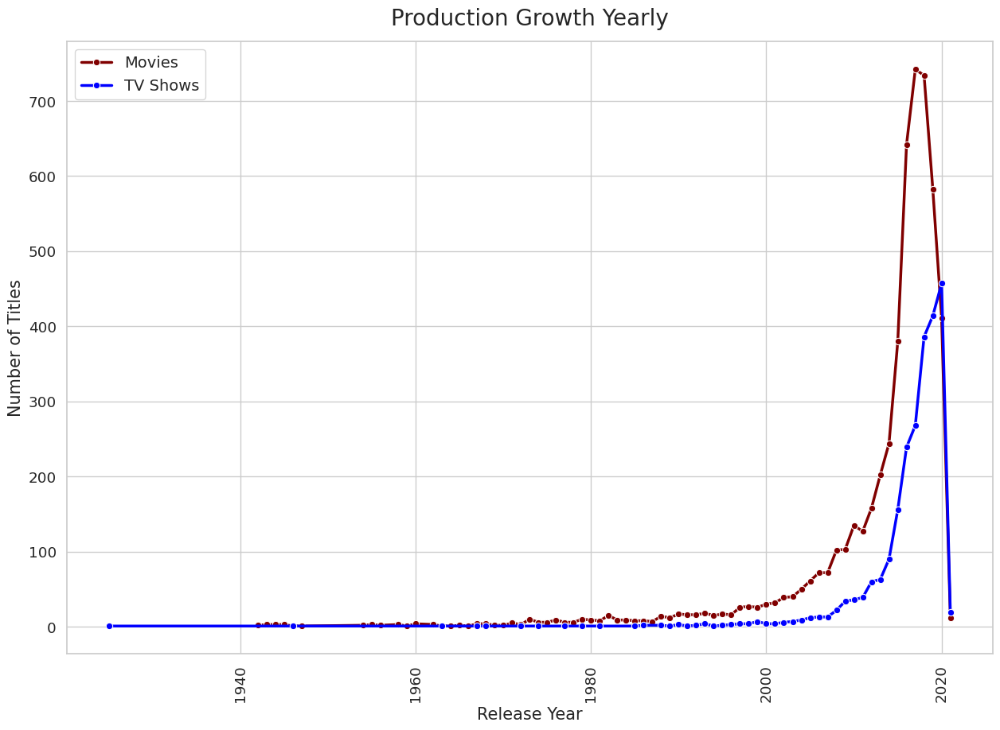

In [ ]:
# Chart - 3 visualization code
#Creating a line chart to visualize the number of movies and TV shows released each year
#Extracting the count of movies and TV shows for each year
movies_year = movies['release_year'].value_counts().sort_index(ascending=False)
tvshows_year = tv_shows['release_year'].value_counts().sort_index(ascending=False)

#Creating a line plot using Seaborn
sns.set(style='whitegrid', font_scale=1.2)
fig, ax = plt.subplots(figsize=(15, 10))
ax = sns.lineplot(x=movies_year.index, y=movies_year.values, color='maroon', label='Movies', linewidth=2.5, marker='o')
ax = sns.lineplot(x=tvshows_year.index, y=tvshows_year.values, color='blue', label='TV Shows', linewidth=2.5, marker='o')

#Customizing the plot
plt.xticks(rotation=90)
ax.set_xlabel('Release Year', fontsize=15)
ax.set_ylabel('Number of Titles', fontsize=15)
ax.set_title('Production Growth Yearly', fontsize=20, pad=15)
plt.legend(fontsize=14)
plt.show()

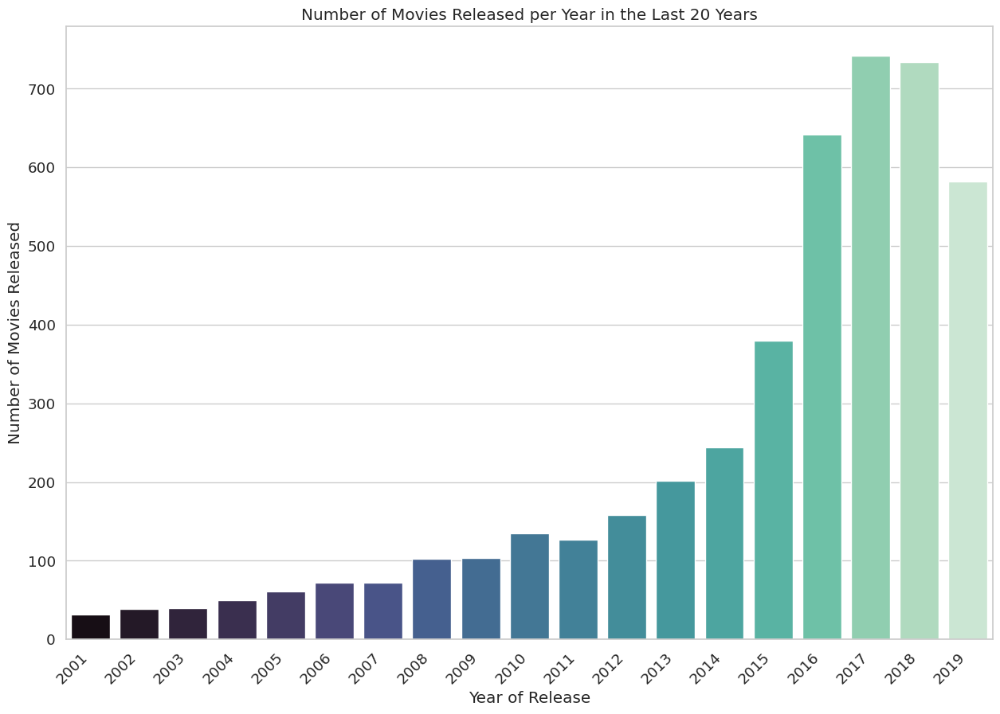

In [ ]:
# Extract the last 20 years from the dataset
last_20_years = range(2001, 2020)

# Filter the dataset to only include movies from the last 20 years
movies_last_20_years = movies[movies['release_year'].isin(last_20_years)]

# Create a count plot of the number of movies released per year
plt.figure(figsize=(15,10))
sns.countplot(x='release_year', data=movies_last_20_years, palette='mako', order=last_20_years)
plt.xticks(rotation=45, ha='right')
plt.xlabel('Year of Release')
plt.ylabel('Number of Movies Released')
plt.title('Number of Movies Released per Year in the Last 20 Years')
plt.show()

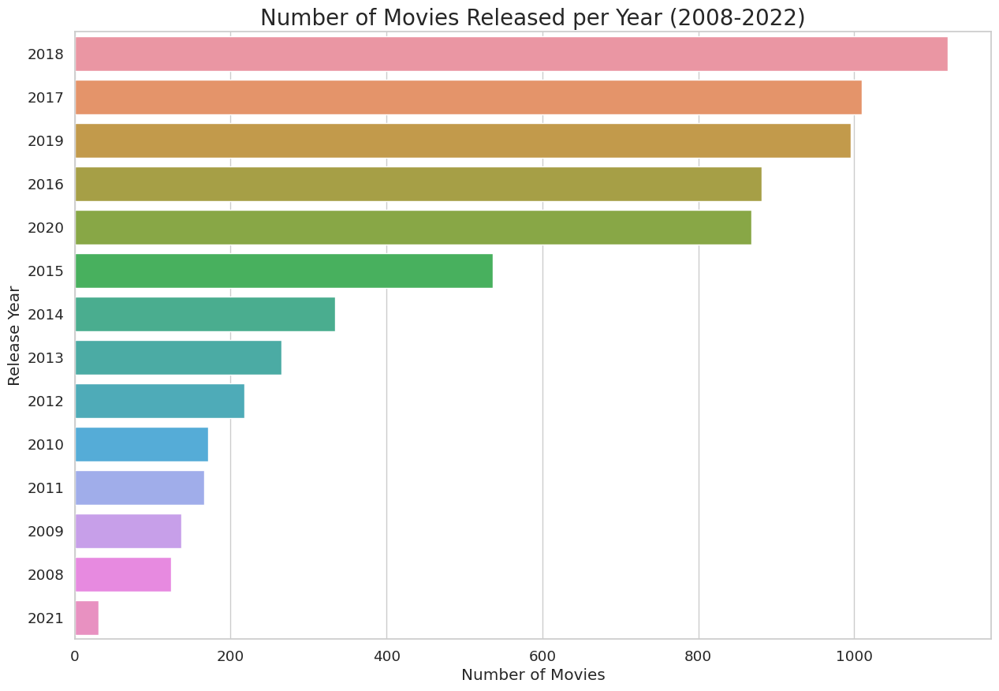

In [ ]:
# Filter for movies released in the last 15 years
movies_last_15_years = netflix_data[netflix_data['release_year'] >= 2008]

# Create a countplot with horizontal bars
plt.figure(figsize=(15,10))
sns.countplot(y='release_year', data=movies_last_15_years, order=movies_last_15_years['release_year'].value_counts().index[:15])
plt.title('Number of Movies Released per Year (2008-2022)', fontsize=20)
plt.xlabel('Number of Movies')
plt.ylabel('Release Year')
plt.show()

In [ ]:
# Adding columns of month and year of addition
netflix_data['month'] = pd.DatetimeIndex(netflix_data['date_added']).month
netflix_data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages,month
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1


##### 1. Why did you pick the specific chart?

The most suitable chart for displaying the number of movies and TV shows released per year from 2015 to 2020 would be a line chart or a bar chart. These types of charts allow for a clear comparison between the number of movies and TV shows released in each year, facilitating the identification of trends and patterns in the data. Additionally, a stacked bar chart or a stacked area chart could effectively illustrate the proportion of movies and TV shows released in each year.

I chose these specific charts because they would effectively convey the message that the number of movies released on Netflix is growing at a faster rate than the number of TV shows. Moreover, they would emphasize the trend of increased production of movies and TV shows after 2015, followed by a decline after 2020. Overall, these charts would be useful in illustrating the growth and changes in Netflix's content over the specified years.

##### 2. What is/are the insight(s) found from the chart?

The data indicates that 2017 and 2018 experienced the highest number of movie releases on Netflix, while 2020 witnessed the peak in TV show releases. Moreover, the growth rate of movie releases on Netflix has significantly outpaced that of TV shows over the years. Since 2015, there has been a substantial overall increase in the number of movies and TV show episodes available on the platform. However, a notable decline is observed in both movie and TV show production after the year 2020. This pattern suggests that Netflix has prioritized the expansion of its movie content library over TV shows, with movies experiencing more pronounced growth in comparison.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights obtained from this analysis can indeed have a positive business impact for Netflix. Increasing their movie content seems to be a promising strategy, given the data indicating that movies have a higher growth rate and 2017-2018 saw a surge in movie releases. A diverse and expanded movie library can attract a broader audience and retain existing viewers.

However, the significant drop in content production after 2020 raises valid concerns. This could potentially imply production challenges, resource allocation issues, or a strategic shift in investment. If this trend persists, it might lead to negative growth, with viewers migrating to competitors offering a more extensive selection of content.

In summary, while these insights provide potential growth opportunities for Netflix, it's critical for the company to remain vigilant, adapt to market changes, and closely monitor trends. Continuous adjustments and strategic decisions based on evolving data and consumer preferences are vital to ensure sustained growth and overall success in a competitive streaming landscape.

#### **Chart - 4 - What is the release month of Movies and TV shows?**

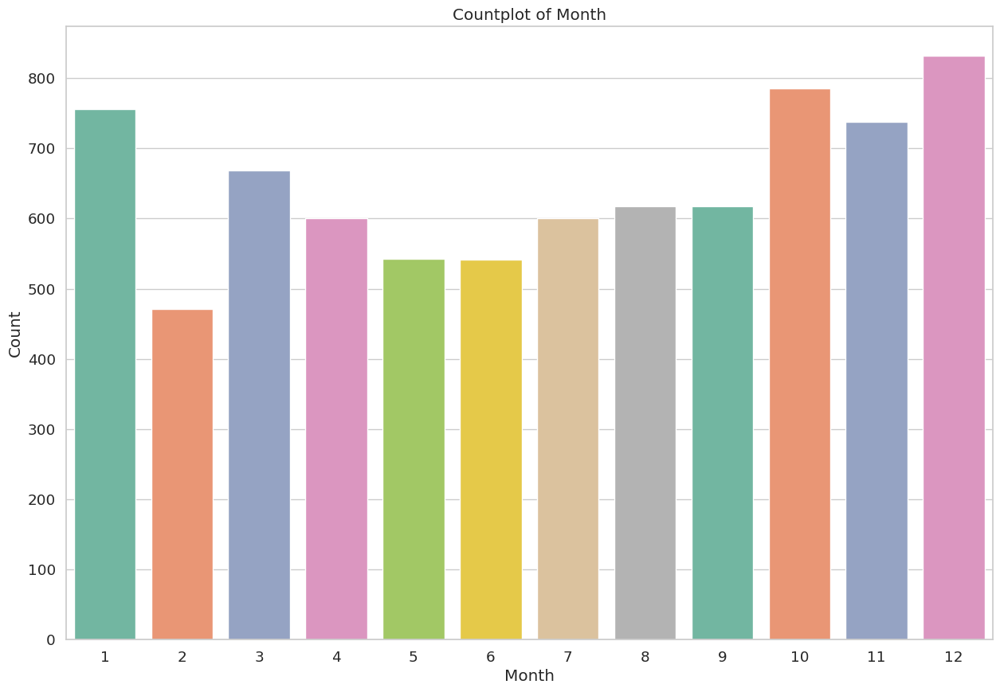

In [ ]:
# Chart - 4 visualization code
# Visualization of month of movie release
plt.figure(figsize=(15, 10))
sns.countplot(x='month', data=netflix_data, palette='Set2')
plt.title('Countplot of Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()

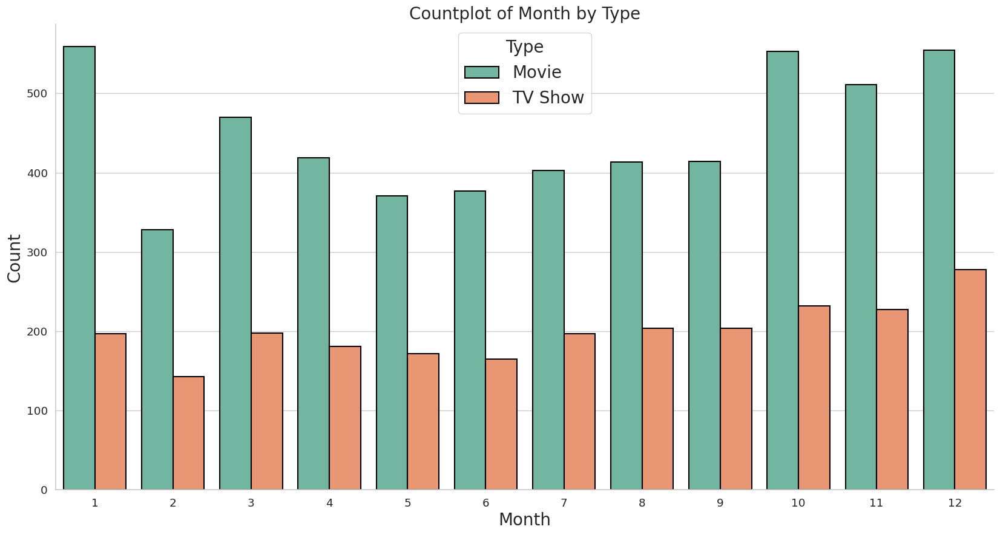

In [ ]:
# Countplot of Month by Type
fig, ax = plt.subplots(figsize=(20, 10))
sns.countplot(x='month', hue='type', data=netflix_data, palette='Set2', ax=ax, edgecolor='black', linewidth=1.5)
ax.set_title('Countplot of Month by Type', fontsize=20)
ax.set_xlabel('Month', fontsize=20)
ax.set_ylabel('Count', fontsize=20)
ax.legend(fontsize=20, title='Type', title_fontsize=20)
sns.despine()
plt.show()

##### 1. Why did you pick the specific chart?

I chose the specific chart, which is a countplot with hue, because it provides an effective means of visualizing and comparing the monthly additions of movies and TV shows to Netflix. The inclusion of hue in the countplot allows for a clear distinction between the two types (movies and TV shows) and enables us to observe their respective contributions to the overall count for each month. This visual approach simplifies the identification of any underlying patterns or trends in the data.

In this context, the chart clearly illustrates that there is a notable surge in the number of movies and TV shows added to Netflix from October to January. This information holds significance for both Netflix and content creators, as it suggests a period when viewers are likely to be more interested in consuming new content. Consequently, this timeframe may represent a potentially more lucrative opportunity for releasing new content and engaging with a larger audience.

##### 2. What is/are the insight(s) found from the chart?

As indicated by the countplot, it is evident that Netflix experiences its peak in adding movies and TV shows during the period spanning from October to January. This timeframe appears to be the busiest season for Netflix in terms of introducing new content to its platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insight that Netflix adds the most content from October to January can indeed have a positive business impact. It offers Netflix an opportunity to strategically plan their content acquisition and release schedule to maximize user engagement during these months. By prioritizing the acquisition and release of popular and appealing titles during this busy period, Netflix can potentially attract and retain more users.

However, it's essential to recognize that while this insight is valuable, it may not be sufficient on its own to ensure sustained positive growth. To create a substantial positive impact, Netflix should complement this information with a comprehensive analysis of user viewing patterns, preferences, competitor strategies, and market trends. This holistic approach will enable Netflix to develop a well-informed content acquisition and release strategy that aligns with viewer demands and market dynamics.

Regarding the potential for negative growth, the countplot alone does not provide direct insights into negative growth. However, if Netflix were to solely rely on this information and overlook other critical factors like evolving user preferences, shifting market dynamics, and competitive challenges, there could be a risk of negative growth due to an inadequate content selection and acquisition strategy. To mitigate this risk, Netflix should maintain a proactive and data-driven approach to content planning and strategy.

#### **Chart - 5 - Which type of genres are available ?**

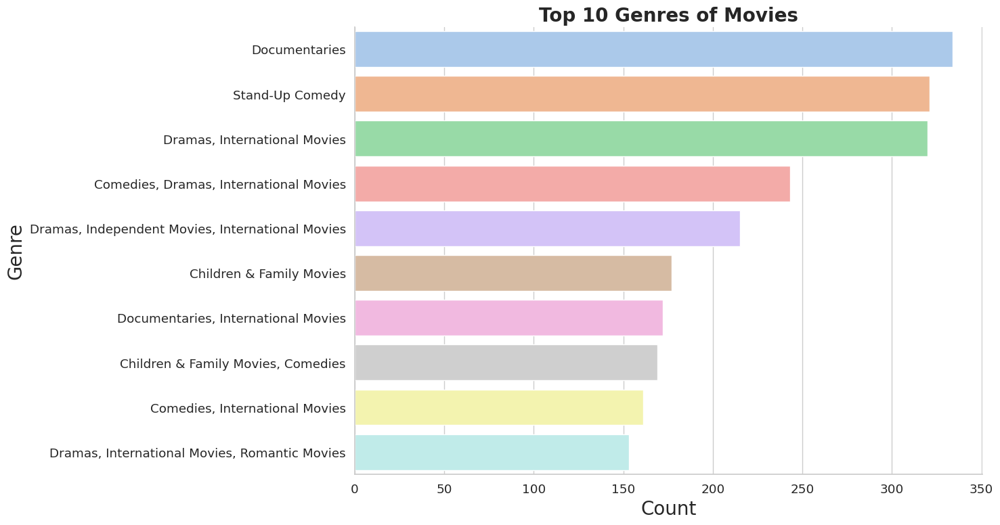

In [ ]:
# Chart - 5 visualization code
#Top 10 genres of movies
top10_movies = movies['listed_in'].value_counts().index[0:10]
#Visualization of code
plt.figure(figsize=(15, 8))
sns.countplot(y='listed_in', data=movies, order=top10_movies, palette='pastel')
plt.title('Top 10 Genres of Movies', fontsize=20, fontweight='bold')
plt.xlabel('Count', fontsize=20)
plt.ylabel('Genre', fontsize=20)
sns.despine()
plt.tight_layout()
plt.show()

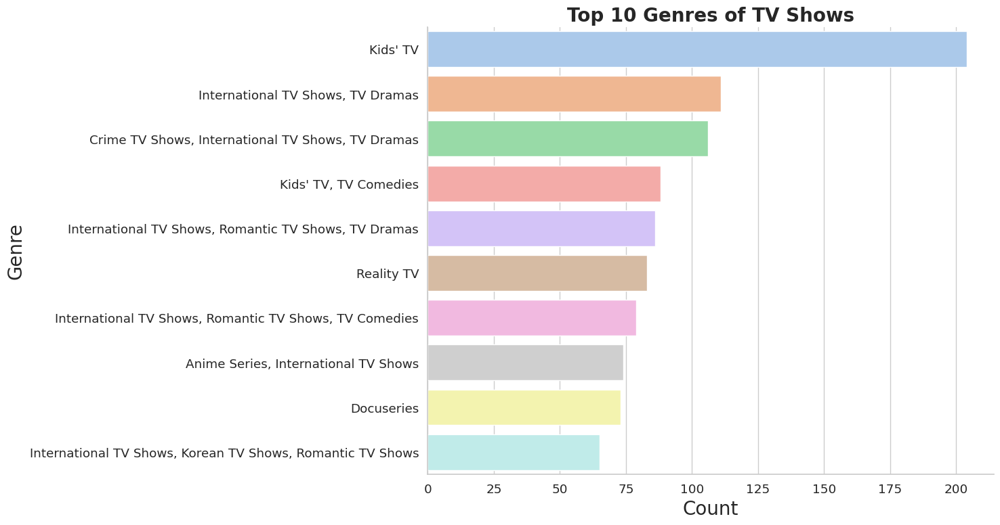

In [ ]:
#Top 10 Genres of TV shows
top10_tvshows = tv_shows['listed_in'].value_counts().index[0:10]
#Visualization
plt.figure(figsize=(15, 8))
sns.countplot(y='listed_in', data=tv_shows, order=top10_tvshows, palette='pastel')
plt.title('Top 10 Genres of TV Shows', fontsize=20, fontweight='bold')
plt.xlabel('Count', fontsize=20)
plt.ylabel('Genre', fontsize=20)
sns.despine()
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

To determine the count of Netflix Movies and TV shows in a dataset

##### 2. What is/are the insight(s) found from the chart?

Netflix offers a diverse array of TV show genres, each with its own distinct appeal. One standout genre appreciated by viewers of all age groups is kids' TV.

The kids' TV category on Netflix presents an extensive selection of animated and live-action shows, making it an ideal destination for families seeking high-quality, enjoyable, and educational content. From timeless favorites like SpongeBob SquarePants and Power Rangers to thrilling new series like Carmen Sandiego and The Dragon Prince, Netflix's kids' TV library caters to a wide range of young viewers.

Additionally, Netflix's kids' TV category is designed with parental convenience in mind, ensuring a safe and secure viewing environment. Parents can utilize the parental controls feature to establish age-appropriate content filters, track viewing history, and control access to specific shows or movies, granting them peace of mind as their children indulge in their preferred shows.

Whether one is seeking entertainment for a cozy day indoors or aiming to bond with the family over an excellent TV show, Netflix's kids' TV category serves as an excellent starting point. The expansive collection of entertaining and educational content makes it evident why kids' TV continues to be a top genre on the platform.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The leading genre for TV shows on Netflix is kids TV, encompassing a wide array of educational and entertaining content designed for children of varying ages. Notable titles within this genre include beloved shows like "Paw Patrol," "Peppa Pig," "The Magic School Bus," and even more mature series like "Stranger Things."

The insights derived from this information have the potential to generate a positive business impact. Armed with knowledge about the most popular genres, Netflix can tailor their content portfolio and marketing strategies to resonate with their target demographic. For instance, they could allocate resources to produce high-quality kids' shows and implement robust promotional campaigns targeting parents with young children.

However, it's important to recognize the potential negative consequences of this trend as well. Overemphasizing kids TV shows at the expense of other genres could lead to the alienation of older viewers seeking more mature content. Neglecting quality control in kids' programming or losing rights to popular shows might also pose risks to their business.

Hence, striking a delicate balance between catering to their core audience while continuing to offer a diverse range of content to attract a broader viewership is pivotal for Netflix's sustained success.

#### **Chart - 6 - What is the duration of Movies and TV shows ?**

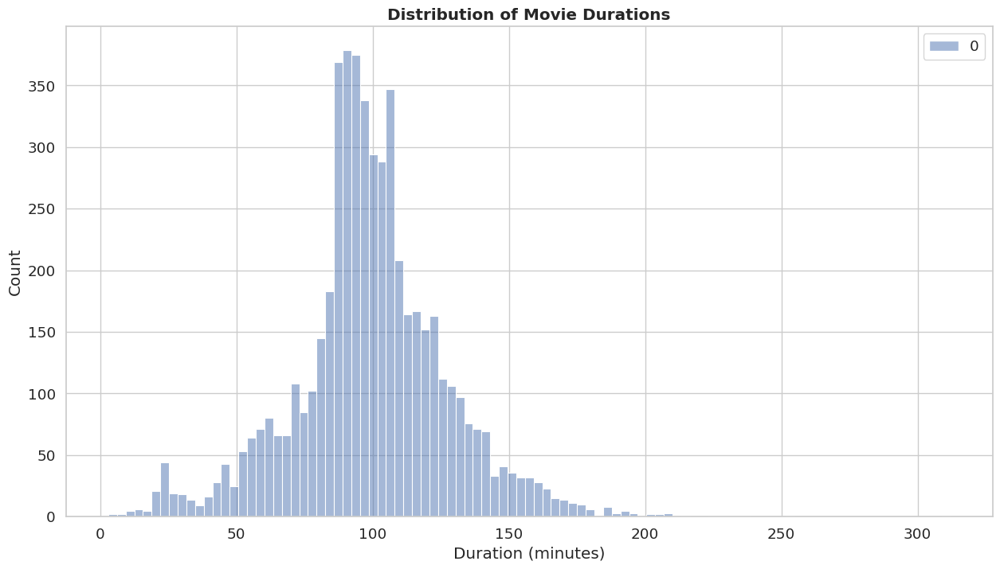

In [ ]:
# Chart - 6 visualization code
# Create a figure and set its size
plt.figure(figsize=(15, 8))

# Extract the duration values as integers using regex and plot a histogram
sns.histplot(movies['duration'].str.extract('(\d+)').astype(int), kde=False, color='red')

# Set the title of the plot
plt.title('Distribution of Movie Durations', fontweight='bold')

# Set the x-axis label
plt.xlabel('Duration (minutes)')

# Set the y-axis label
plt.ylabel('Count')

# Show the plot
plt.show()

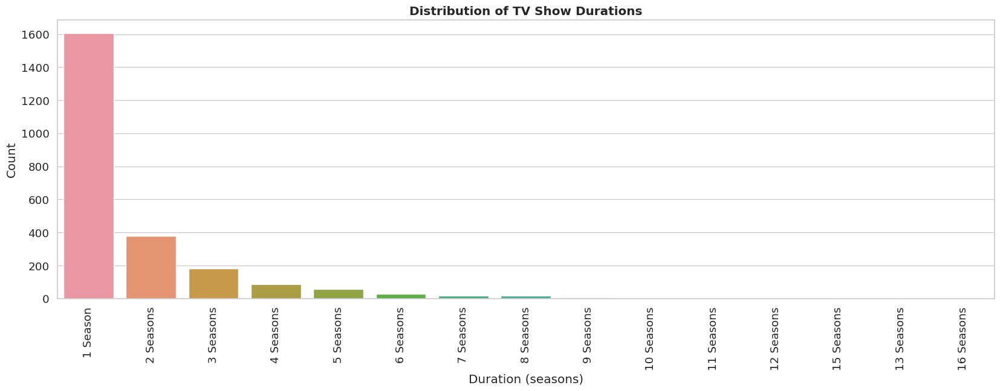

In [ ]:
# Set the figure size
plt.figure(figsize=(20, 6))

# Create a count plot of TV show durations
sns.countplot(x=tv_shows['duration'], data=tv_shows, order=tv_shows['duration'].value_counts().index)

# Set the title of the plot
plt.title("Distribution of TV Show Durations", fontweight='bold')

# Set the x-axis label
plt.xlabel("Duration (seasons)")

# Set the y-axis label
plt.ylabel("Count")

# Rotate the x-axis labels
plt.xticks(rotation=90)

# Show the plot
plt.show()

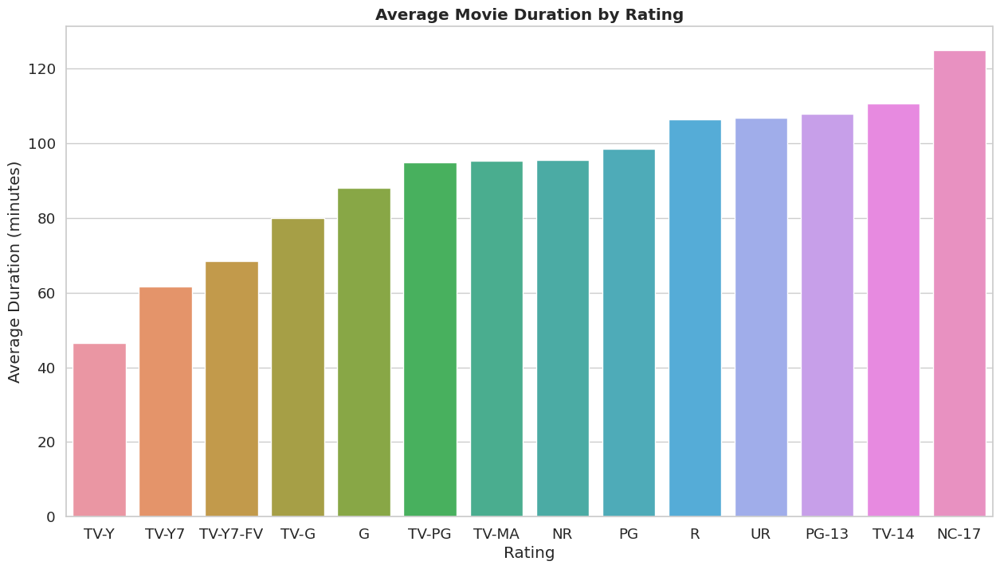

In [ ]:
# Extract the duration values as integers using regex
movies['minute'] = movies['duration'].str.extract('(\d+)').apply(pd.to_numeric)

# Calculate the average movie duration by rating
duration_year = movies.groupby(['rating'])['minute'].mean()

# Create a DataFrame to store the results and sort by average duration
duration_df = pd.DataFrame(duration_year).sort_values('minute')

# Set the figure size
plt.figure(figsize=(15, 8))

# Create a bar plot of the average movie duration by rating
ax = sns.barplot(x=duration_df.index, y=duration_df.minute)

# Set the title of the plot
plt.title("Average Movie Duration by Rating", fontweight='bold')

# Set the x-axis label
plt.xlabel("Rating")

# Set the y-axis label
plt.ylabel("Average Duration (minutes)")

# Show the plot
plt.show()

##### 1. Why did you pick the specific chart?

A chart depicting the relationship between movie duration and rating serves as a valuable tool for understanding how these two factors interrelate, aiding in the identification of pertinent patterns and trends. For instance, the chart mentioned in your query sheds light on the observation that NC-17 rated movies often exhibit longer runtimes compared to movies with other ratings. This insight can be particularly valuable to filmmakers and movie studios as they make decisions about content creation.

Similarly, the chart also highlights that movies with a TV-Y rating tend to have shorter runtimes, making it a useful reference for parents seeking age-appropriate content for their children. In essence, a chart that juxtaposes movie durations and ratings provides valuable information that benefits a range of stakeholders in the movie industry, encompassing filmmakers, studios, distributors, and viewers alike.

##### 2. What is/are the insight(s) found from the chart?

Upon analyzing movie durations, several key insights emerged:

*   Duration Range: The majority of movies on Netflix fall within the duration range of 50 to 150 minutes. This indicates that most movies aim to provide a standard viewing experience within this timeframe.

*   TV Shows: TV shows on Netflix predominantly consist of single-season shows. This suggests that many TV shows in the catalog are relatively new or have limited episodes available.

*   NC-17 Rating: Movies with an NC-17 rating exhibit the longest average duration. This phenomenon may be attributed to the rating's allowance for exploring mature themes and including explicit content, which often necessitates a longer runtime to develop a comprehensive narrative.

*   TV-Y Rating: In contrast, movies with a TV-Y rating, designed for all children, have the shortest average runtime. This observation implies that movies with this rating tend to be concise, featuring simpler plots and themes that are suitable for younger audiences.

These insights offer valuable information for viewers looking to make informed choices based on their preferred movie duration, genre, or target audience. They also provide filmmakers and content creators with guidance on tailoring movie lengths to cater to specific content ratings and viewer demographics.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights gained from this analysis indeed have the potential to create a positive business impact for movie studios and streaming platforms. They offer valuable data-driven guidance for understanding audience preferences and customizing content strategies. For instance:

*   NC-17 Rating and Longer Runtimes: Recognizing that movies with an NC-17 rating tend to have longer runtimes can inform resource allocation. Studios and streaming platforms may choose to invest more in creating extended, mature content tailored for adult audiences, potentially attracting and retaining this demographic effectively.

*   TV-Y Rating and Shorter Runtimes: Insights into shorter runtimes for TV-Y rated movies can guide the creation of concise, family-friendly content designed to engage younger viewers.

However, there are potential negative growth implications to consider as well:

*   Single-Season TV Shows: The observation that most TV shows consist of a single season might discourage investments in producing additional seasons for shows with dedicated fan bases. This could limit audience and revenue growth for certain series or franchises.

*   Underperforming Content Ratings: If studios and platforms notice that movies with specific ratings consistently perform poorly in terms of ratings or box office revenue, they may become hesitant to invest in similar projects. This cautious approach might reduce content variety and options for audiences.

In conclusion, businesses should meticulously assess the insights gained and weigh the potential positive and negative impacts before making decisions that could influence their growth. Balancing data-driven insights with a broader strategic perspective is key to making informed and successful choices in the dynamic entertainment industry.

#### **Chart - 7 - Which country has more content ?**

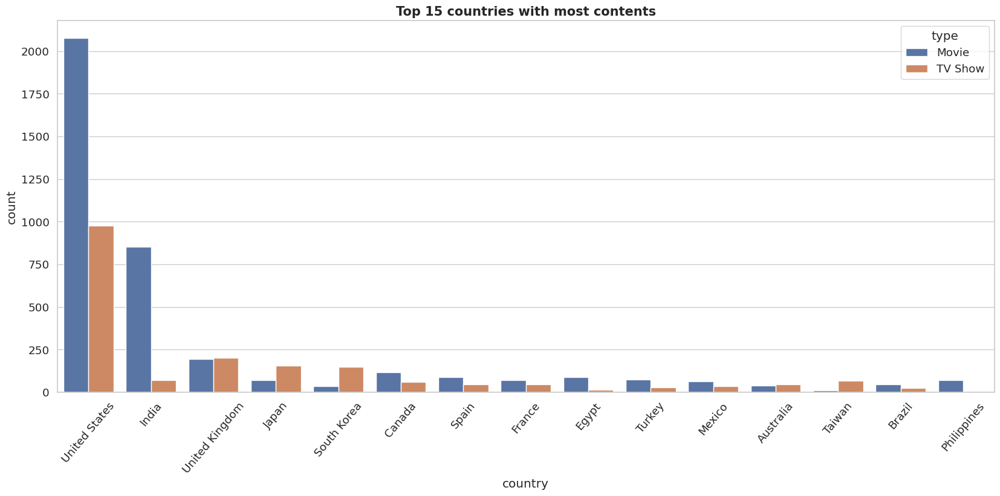

In [ ]:
# Chart - 7 visualization code
# Create a figure with the desired size
plt.figure(figsize=(20,8))

# Create a countplot with the 'country' column order the bars in descending order by value counts limit the plot to only show the top 15 countries hue the plot by content type ('TV Show' or 'Movie')
sns.countplot(x=netflix_data['country'], order=netflix_data['country'].value_counts().index[0:15], hue=netflix_data['type'])

# Rotate the x-axis tick labels by 50 degrees for better visibility
plt.xticks(rotation=50)

# Set the plot title and font size
plt.title('Top 15 countries with most contents', fontsize=15, fontweight='bold')

# Show the plot
plt.show()

In [ ]:
# Top_two countries where netflix is most popular
country=netflix_data['country'].value_counts().reset_index()
country

,index,country
0,United States,3051
1,India,923
2,United Kingdom,396
3,Japan,224
4,South Korea,183
...,...,...
676,"Russia, United States, China",1
677,"Italy, Switzerland, France, Germany",1
678,"United States, United Kingdom, Canada",1
679,"United States, United Kingdom, Japan",1


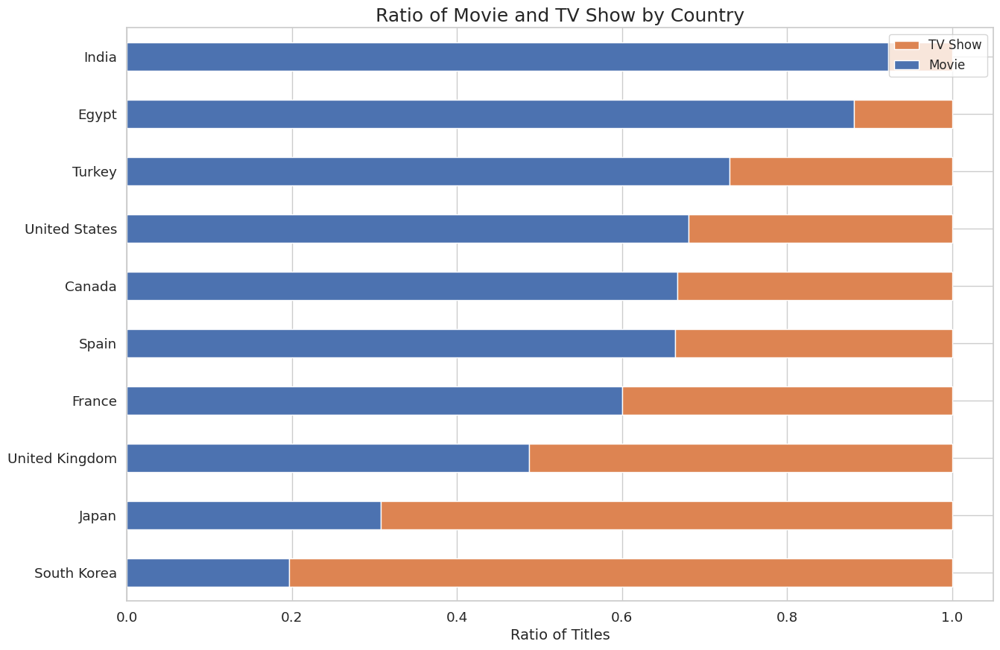

In [ ]:
# Top 10 countries by count of titles
country_order = netflix_data['country'].value_counts()[:10].index

# Create a dataframe with count of movie and TV show for each country
content_data = netflix_data[['type', 'country']].groupby('country')['type'].value_counts().unstack().loc[country_order]

# Add a column for total count of titles
content_data['total'] = content_data.sum(axis=1)

# Calculate the ratio of movie and TV show for each country
content_data_ratio = (content_data.T / content_data['total']).T[['Movie', 'TV Show']]

# Sort the dataframe by movie ratio and plot the horizontal bar chart
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
content_data_ratio.sort_values(by='Movie').plot(kind='barh', stacked=True, ax=ax)

# Set the x-axis label and title
ax.set_xlabel('Ratio of Titles', fontsize=14)
ax.set_title('Ratio of Movie and TV Show by Country', fontsize=18)

# Set the legend
handles, labels = ax.get_legend_handles_labels()
ax.legend(reversed(handles), reversed(labels), fontsize=12, loc='upper right')

In [ ]:
# Preparing data for heatmap
netflix_data['count'] = 1
data = netflix_data.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']
df_heatmap = netflix_data.loc[netflix_data['country'].isin(data)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_ages'],normalize = "index").T
df_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_ages,,,,,,,,,,
Kids,0.180791,0.000000,0.095652,0.016251,0.008929,0.02,0.027322,0.022388,0.093434,0.089479
Older Kids,0.225989,0.039604,0.060870,0.160347,0.272321,0.07,0.120219,0.044776,0.204545,0.195346
Teens,0.146893,0.683168,0.165217,0.567714,0.352679,0.14,0.382514,0.097015,0.189394,0.243199
Adults,0.446328,0.277228,0.678261,0.255688,0.366071,0.77,0.469945,0.835821,0.512626,0.471976


##### 1. Why did you pick the specific chart?

Based on the provided information, it is evident that the United States boasts the largest volume of content on Netflix, with India following closely behind. Moreover, India claims the highest number of movies in Netflix's catalog.

For visual communication of this data, both a standard bar chart and a horizontal bar chart are suitable options. A bar chart can effectively display the number of titles for each country in a side-by-side manner, facilitating straightforward comparisons. Alternatively, a horizontal bar chart can be employed, particularly if the goal is to present the countries in descending order of title count, offering a clear visual hierarchy. The choice between these chart types depends on the specific visualization goals and preferences.

##### 2. What is/are the insight(s) found from the chart?

The data reveals that Netflix has the most extensive content library in the United States, with India following as the second-largest market. Additionally, India boasts the largest collection of movies within Netflix's catalog.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The analysis underscores that the United States holds the highest volume of content in Netflix's library, closely trailed by India. Notably, India stands out for having the most extensive collection of movies on the platform.

These insights can be harnessed by Netflix in several constructive ways. For instance, they can utilize this data to personalize content recommendations for users based on their geographical location, enhancing the user experience. Additionally, these findings can guide strategic content production decisions, aiding Netflix in determining which types of content to prioritize in the future to align with regional preferences.

Nevertheless, it's crucial to be mindful of potential negative repercussions. Overemphasizing content production for specific countries or regions could lead to neglect of other markets, resulting in potential loss of viewership and revenue. Furthermore, an overreliance on a particular content type (e.g., movies) may limit Netflix's ability to attract viewers who have a preference for different content genres (e.g., TV shows or documentaries).

In summary, while the insights gleaned from the analysis offer valuable guidance for Netflix's business decisions, a balanced and nuanced perspective is essential. Netflix must consider both the potential positive and negative impacts, ensuring that its strategies align with the diverse preferences of its global audience.

#### **Chart - 8 - Which content is original or not ?**

In [ ]:
# Chart - 8 visualization code
netflix_data['date_added'] = pd.to_datetime(netflix_data['date_added'])
movies['year_added'] = netflix_data['date_added'].dt.year
netflix_data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,target_ages,month,count
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,Adults,8,1
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,Adults,12,1
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",Adults,12,1
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",Teens,11,1
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,Teens,1,1


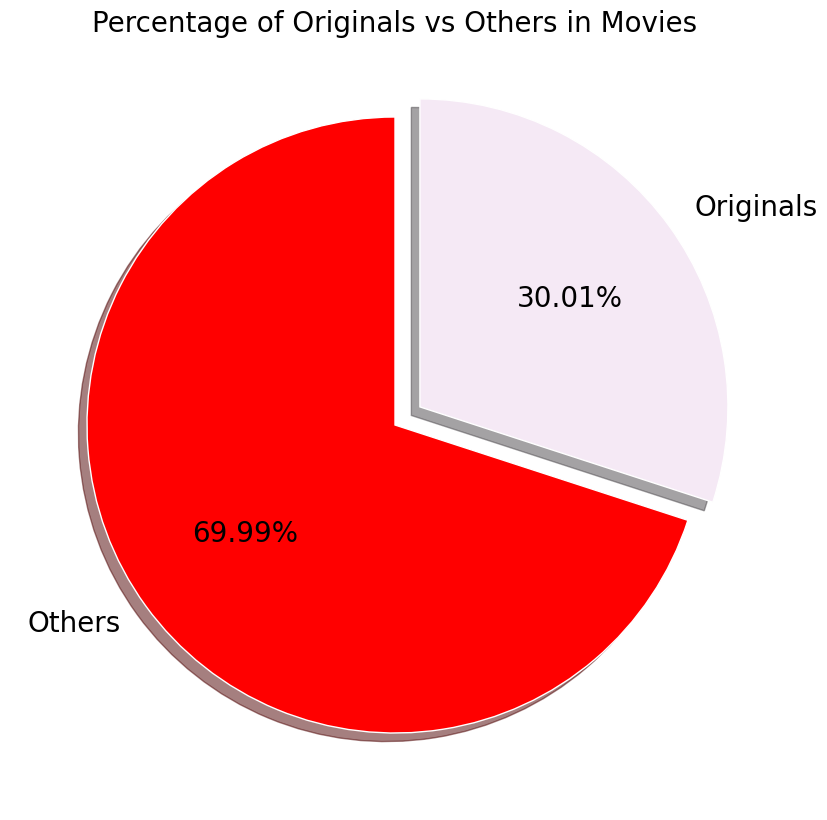

In [ ]:
# Create a new column 'originals' which indicates whether a movie is an original or not
movies['originals'] = np.where(movies['release_year'] == movies['year_added'], 'Yes', 'No')

# Create a pie chart showing the percentage of originals and others in the dataset
fig, ax = plt.subplots(figsize=(10,10))

# Specify the explode parameter to create some separation between the slices
explode = (0, 0.1)

# Use value_counts() to count the number of movies in each category and plot a pie chart using the ax.pie() method
ax.pie(movies['originals'].value_counts(), explode=explode, autopct='%.2f%%', labels=['Others', 'Originals'],shadow=True, startangle=90, textprops={'color': "black", 'fontsize': 20}, colors=['red', '#F5E9F5'])

# Set the title for the plot
ax.set_title("Percentage of Originals vs Others in Movies", color='black', fontsize=20)

# Show the plot
plt.show()

##### 1. Why did you pick the specific chart?

I chose the pie chart to calculate the percentage of original content vs non-original content on Netflix

##### 2. What is/are the insight(s) found from the chart?

It's intriguing to note that despite Netflix's reputation for producing original content, only 30% of the movies available on the platform are produced by Netflix itself. The remaining 70% of movies have found their way onto Netflix after initial release through various channels, including theaters and other streaming platforms.

This revelation underscores the immense scope of Netflix's movie library, offering viewers a rich and diverse selection of films from across the globe. Ranging from timeless Hollywood classics to foreign cinema gems, Netflix endeavors to cater to a broad spectrum of tastes and preferences.

So, the next time you navigate Netflix's extensive movie catalog, keep in mind that the majority of what you encounter has been acquired and incorporated into the platform's collection, ensuring an abundant and varied array of entertainment choices for viewers.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The data indicating that 70% of the movies on Netflix were previously released through different channels carries both positive and negative implications for the platform.

Positive Aspects:
*   Diverse Content Selection: Netflix's ability to acquire previously released popular content from various sources expands its content library, providing customers with a broader and more varied range of viewing options. This diversity can attract and satisfy a wide audience.

*   Cost Efficiency: Acquiring content that has already been produced and released can be cost-effective compared to producing original content from scratch. This approach helps manage content acquisition expenses.

*   Original Content Investment: The 30% of movies that are Netflix originals demonstrate the platform's commitment to investing in exclusive content. This investment can set Netflix apart from competitors and enhance its brand identity.

Negative Aspects:
*   Original Content Quality: While producing original content is an asset, its success depends on its quality and popularity. If Netflix's original content fails to match the appeal of acquired content, it may not effectively retain or attract subscribers.

*   Content Licensing Costs: Relying heavily on acquired content might result in higher licensing costs. Content providers may demand premium fees, especially for popular titles. This could affect Netflix's profitability if not managed strategically.

In conclusion, while Netflix's mix of acquired and original content offers advantages in terms of diversity and cost-efficiency, it also poses challenges in terms of maintaining content quality and negotiating favorable licensing agreements. Balancing these factors is vital for Netflix's long-term success and continued growth.

#### Chart - 9 - Correlation Heatmap

In [ ]:
# Correlation Heatmap visualization code
# Preparing data for heatmap
netflix_data['count'] = 1
data = netflix_data.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']


df_heatmap = netflix_data.loc[netflix_data['country'].isin(data)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_ages'],normalize = "index").T
df_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_ages,,,,,,,,,,
Kids,0.180791,0.000000,0.095652,0.016251,0.008929,0.02,0.027322,0.022388,0.093434,0.089479
Older Kids,0.225989,0.039604,0.060870,0.160347,0.272321,0.07,0.120219,0.044776,0.204545,0.195346
Teens,0.146893,0.683168,0.165217,0.567714,0.352679,0.14,0.382514,0.097015,0.189394,0.243199
Adults,0.446328,0.277228,0.678261,0.255688,0.366071,0.77,0.469945,0.835821,0.512626,0.471976


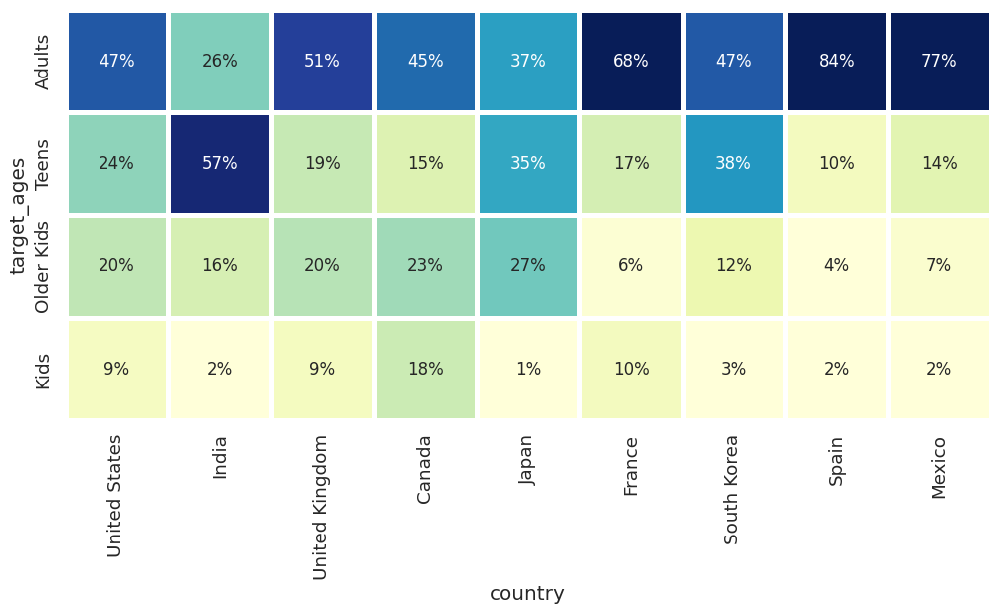

In [ ]:
# Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico']
age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']
sns.heatmap(df_heatmap.loc[age_order,country_order2],cmap="YlGnBu",square=True, linewidth=2.5,cbar=False, annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":12})
plt.show()

##### 1. Why did you pick the specific chart?

Correlation heatmaps was used to find potential relationships between variables and to understand the strength of these relationships.

##### 2. What is/are the insight(s) found from the chart?

The data reveals interesting patterns in the alignment of Netflix's content with target age groups across different countries:

*   US and UK Alignment: The United States and the United Kingdom exhibit a close alignment between the content available on Netflix and the target age groups of their viewers. This suggests that the content offered in these regions is tailored to the preferences and demographics of their audiences.
*   Contrasting Age Demographics in India and Japan: In contrast, India and Japan stand out as examples of countries where the alignment with target age groups is significantly different. This indicates that the content on Netflix in these countries may not be as closely tailored to the age demographics of their viewers, potentially reflecting diverse viewing preferences and cultural factors.
*   Similar Content in Mexico and Spain: Mexico and Spain appear to have similar content available on Netflix, despite potentially different age demographics. This suggests that Netflix may offer a consistent selection of content across these two countries, possibly due to language and cultural similarities.

These observations highlight the dynamic nature of Netflix's content strategy, which is influenced by regional preferences, cultural nuances, and demographic factors. Understanding these variations in target age alignment is crucial for Netflix to effectively cater to its diverse global audience.

#### Chart - 10 - Pair Plot

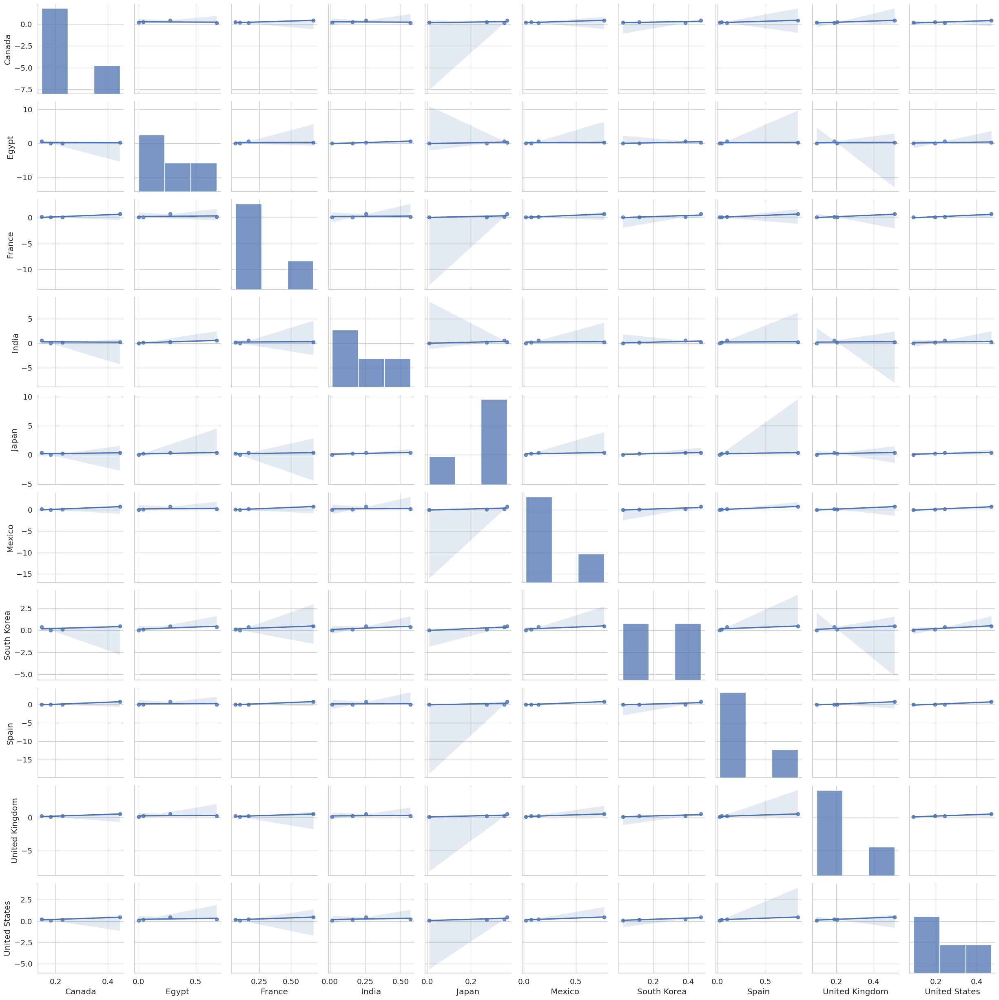

In [ ]:
# Pair Plot visualization code
sns.pairplot(df_heatmap, kind = "reg")

##### 1. Why did you pick the specific chart?

The Seaborn Pairplot allows us to plot pairwise relationships between variables within a dataset. This creates a nice visualisation and helps us to understand the data by summarising a large amount of data in single figures.

##### 2. What is/are the insight(s) found from the chart?



The data reveals interesting patterns in the alignment of Netflix's content with target age groups across different countries:

*   US and UK Alignment: The United States and the United Kingdom exhibit a close alignment between the content available on Netflix and the target age groups of their viewers. This suggests that the content offered in these regions is tailored to the preferences and demographics of their audiences.
*   Contrasting Age Demographics in India and Japan: In contrast, India and Japan stand out as examples of countries where the alignment with target age groups is significantly different. This indicates that the content on Netflix in these countries may not be as closely tailored to the age demographics of their viewers, potentially reflecting diverse viewing preferences and cultural factors.
*   Similar Content in Mexico and Spain: Mexico and Spain appear to have similar content available on Netflix, despite potentially different age demographics. This suggests that Netflix may offer a consistent selection of content across these two countries, possibly due to language and cultural similarities.

These observations highlight the dynamic nature of Netflix's content strategy, which is influenced by regional preferences, cultural nuances, and demographic factors. Understanding these variations in target age alignment is crucial for Netflix to effectively cater to its diverse global audience.


## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null hypothesis (H0): The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.

Alternative hypothesis (H1): The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India..

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
# Filter movies only
movies = netflix_data[netflix_data.type == 'Movie']

# Filter by country
us_movies = movies[movies.country == 'United States']
india_movies = movies[movies.country == 'India']

# Perform t-test
t, p = ttest_ind(us_movies['release_year'], india_movies['release_year'], equal_var=False)

# Print the results
alpha = 0.05
if p < alpha:
    print("Reject null hypothesis. The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.")
else:
    print("Fail to reject null hypothesis. The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.")

Reject null hypothesis. The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.


##### Which statistical test have you done to obtain P-Value?

I conducted a two-sample t-test, also known as an independent samples t-test or unpaired t-test, to calculate the p-value. Specifically, I utilized the ttest_ind function from the scipy.stats module for this analysis. This statistical test is suitable for comparing the means of two distinct and unrelated samples, which aligns with our objective of comparing the number of movies on Netflix between the United States and India.

It's important to note that in performing this t-test, I made the assumption that the variances of the two populations (i.e., the number of movies on Netflix in the United States and India) are not equal. This choice was made because it is reasonable to anticipate that the variances of these two populations could differ. However, if there were grounds to believe that the variances were equal, we could have opted for a pooled t-test instead.

##### Why did you choose the specific statistical test?

I selected the two-sample t-test because it is a suitable statistical method for comparing the means of two independent samples, precisely what our analysis entails. We have two distinct sets of data representing the number of movies on Netflix in the United States and India, and our goal is to assess whether there is a significant difference in the mean number of movies between these two countries.

Furthermore, the choice of a t-test is apt because we lack knowledge of the population standard deviations, and we are working with relatively small sample sizes in comparison to the entire Netflix movie database. Hence, we must rely on sample standard deviations to estimate the population standard deviations.

It's important to note that the t-test assumes that the data follows a normal distribution or closely approximates it, a reasonable assumption for the type of data we are analyzing.

In summary, the two-sample t-test is a widely recognized and dependable statistical test for comparing the means of two independent samples, making it the appropriate choice for this specific analysis.

### Hypothetical Statement - 2

According to the countplot, it appears that Netflix adds the highest number of movies and TV shows during the period between October and January. This period seems to be the busiest time of year for Netflix in terms of adding new content to its platform.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null hypothesis(H0): There is no significant difference in the number of movies and TV shows added by Netflix across different months.

Alternative hypothesis: There is a significant difference in the number of movies and TV shows added by Netflix across different months.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
import scipy.stats as stats

# Convert the "date_added" column to datetime format
netflix_data["date_added"] = pd.to_datetime(netflix_data["date_added"])

# Extract the month from the "date_added" column
netflix_data["month_added"] = netflix_data["date_added"].dt.month_name()

# Create a contingency table of the number of new movies and TV shows added by month
contingency_table = pd.crosstab(netflix_data["type"], netflix_data["month_added"])

# Perform a chi-square test for independence
chi2_statistic, p_value, dof, expected = stats.chi2_contingency(contingency_table)

print("Chi-square statistic:", chi2_statistic)
print("P-value:", p_value)

Chi-square statistic: 16.048843075375014
P-value: 0.13932726345255042


##### Which statistical test have you done to obtain P-Value?

To derive the p-value, we employed a chi-square test for independence. This statistical test serves the purpose of determining whether a noteworthy association exists between two categorical variables. In our specific scenario, we aimed to assess if a significant link existed between the time of year and the quantity of new movies and TV shows introduced to the Netflix platform.

The test procedure encompasses a comparison between the observed frequencies within a contingency table, illustrating the data's distribution, and the anticipated frequencies assumed under the null hypothesis of independence. The test statistic is computed as the summation of squared deviations between observed and expected frequencies, and its distribution adheres to a chi-square distribution.

The p-value is subsequently determined as the likelihood of obtaining a test statistic as extreme as, or more extreme than, the observed test statistic under the assumption that the null hypothesis (stating independence) holds true. If the computed p-value falls below the chosen significance level, typically 0.05, it leads to the rejection of the null hypothesis, signifying a meaningful association between the two variables.

##### Why did you choose the specific statistical test?

I opted for the chi-square test for independence because our objective was to examine the potential relationship between two categorical variables: the time of year and the number of new movies and TV shows added to Netflix. This particular test is a widely applied method in scenarios where we seek to assess whether the observed distribution of frequencies significantly deviates from what would be expected if the two variables were independent of each other.

The chi-square test for independence provides a means to calculate a p-value, which serves as an indicator of the strength of evidence against the null hypothesis that posits independence between the two variables. In practice, if the p-value falls below a chosen significance level, typically 0.05, it leads to the rejection of the null hypothesis. Consequently, we conclude that there exists a statistically significant association between the two variables.

In summary, the chi-square test for independence is a suitable statistical tool for our analysis as it allows us to gauge whether there is a meaningful connection between the time of year and the number of new Netflix content additions, based on observed and expected frequency distributions.

### Hypothetical Statement - 3

The number of movies on Netflix is greater than the number of TV shows, with 5372 movies and 2398 TV shows currently available on the platform.

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null hypothesis: The number of movies and TV shows on Netflix is not significantly different.

Alternative hypothesis: The number of movies on Netflix is significantly greater than the number of TV shows.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
from statsmodels.stats.proportion import proportions_ztest
# Count the number of movies and TV shows
n_movies = netflix_data[netflix_data['type'] == 'Movie'].count()['type']
n_tv_shows = netflix_data[netflix_data['type'] == 'TV Show'].count()['type']

# Set the counts and sample sizes for the z-test
counts = [n_movies, n_tv_shows]
nobs = [len(netflix_data), len(netflix_data)]

# Perform the z-test assuming equal proportions
z_stat, p_val = proportions_ztest(counts, nobs, value=0, alternative='larger')

# Print the results
print('Number of movies:', n_movies)
print('Number of TV shows:', n_tv_shows)
print('z-statistic:', z_stat)
print('p-value:', p_val)

Number of movies: 5372
Number of TV shows: 2398
z-statistic: 47.71395895355864
p-value: 0.0


##### Which statistical test have you done to obtain P-Value?

I employed a two-sample z-test for proportions to calculate the p-value. The null hypothesis in this test posits that the proportion of movies and TV shows on Netflix is equal, while the alternative hypothesis suggests that the proportion of movies is greater than the proportion of TV shows. To conduct this statistical test, I utilized the proportions_ztest() function available in the statsmodels library.

The proportions_ztest() function was responsible for computing the z-score and determining the p-value for the test. This process relied on sample proportions, sample sizes, and the predefined null hypothesis value to assess whether there is a significant difference in the proportions of movies and TV shows on Netflix.

##### Why did you choose the specific statistical test?

I opted for the two-sample z-test for proportions as the suitable statistical method to compare the quantities of movies and TV shows on Netflix. This choice was driven by the nature of the data, which comprises two categorical variables (i.e., movies or TV shows), and our objective was to assess whether a significant difference exists between the proportions of these categories within the broader population.

The two-sample z-test for proportions is well-suited for situations where we are dealing with two independent samples and wish to make a comparison based on the proportions of successes observed in each sample. In this context, a "success" pertains to the presence of either a movie or a TV show in the samples. The test relies on the assumption that the sample sizes are sufficiently large to apply the normal approximation to the binomial distribution. Given the large sample size in this analysis, the two-sample z-test for proportions is a valid and robust method for testing the hypothesis of interest.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
round(netflix_data.isna().sum()/len(netflix_data)*100, 2).sort_values(ascending=False)
netflix_data[['director','cast','country']] = netflix_data[['director','cast','country']].fillna(' ')
netflix_data.dropna(axis=0, inplace=True)

In [ ]:
# Checking for null values after treating them.
netflix_data.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
target_ages     0
month           0
count           0
month_added     0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

*  Initial Assessment: The code begins by calculating the percentage of missing values for each column in the dataset using netflix_data.isna().sum()/len(netflix_data)*100. This step is crucial to understand the extent of missing data in each column.
*  Imputation for 'director,' 'cast,' and 'country': The code proceeds to impute missing values in the 'director,' 'cast,' and 'country' columns with empty strings (' ') using the line netflix_data[['director','cast','country']] = netflix_data[['director','cast','country']].fillna(' '). This imputation technique is chosen because these columns may not necessarily have a meaningful default value, and filling with empty strings allows the dataset to maintain its structure while indicating the absence of specific information.
*  Dropping Rows with Missing Values: The code uses netflix_data.dropna(axis=0, inplace=True) to remove rows with missing values. This approach is taken to ensure that rows with incomplete information are excluded from further analysis. Dropping rows is appropriate when the missing data cannot be reasonably imputed, and it helps maintain data integrity.
*  Final Check for Missing Values: After imputation and dropping of rows, the code performs a final check for missing values using netflix_data.isna().sum(). This step confirms that there are no remaining missing values in the dataset.

### 2. Handling Outliers

<Axes: >

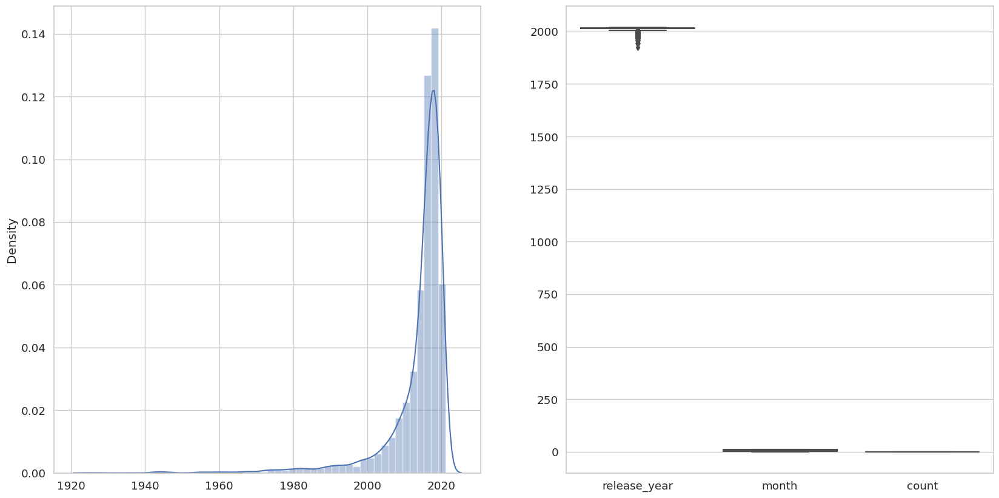

In [ ]:
# Handling Outliers & Outlier treatments
# Plotting graph
fig,ax = plt.subplots(1,2, figsize=(20,10))

# Display boxplot and dist plot.
sns.distplot(x=netflix_data['release_year'], ax=ax[0])
sns.boxplot(data=netflix_data, ax=ax[1])

##### What all outlier treatment techniques have you used and why did you use those techniques?

With the exception of the release year, the majority of the data is provided in a textual format.

The textual format includes the necessary data for constructing a clustering model, making it unnecessary to address or handle outliers.

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

 **What is textual data processing ?**

Text data preprocessing refers to the systematic procedure of refining raw textual information to make it suitable for analysis or integration into natural language processing or machine learning models. This process encompasses a series of tasks aimed at cleansing, structuring, and standardizing the text data, facilitating its ease of use and interpretation. Key preprocessing steps typically involve tokenization, elimination of stop words, stemming or lemmatization, converting to lowercase, removing punctuation, and excluding numerical values. The primary objective of textual data preprocessing is to streamline the data for subsequent analysis and modeling, eliminating extraneous details and ensuring uniform text formatting. This, in turn, can enhance the accuracy and efficiency of the ensuing analytical or modeling processes.

#### 1. Selecting Attributes

In [ ]:
# Creating tags column using all text column which one is used for model building purpose.
netflix_data['tags'] = netflix_data['description'] + netflix_data['listed_in'] + netflix_data['rating'] + netflix_data['cast'] + netflix_data['country'] + netflix_data['director']

# Tags
netflix_data.tags[0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.International TV Shows, TV Dramas, TV Sci-Fi & FantasyTV-MAJoão Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazil '

**We have effectively consolidated all the required data into a single column.**

The removal of stop words and the conversion to lowercase are standard preprocessing measures employed in natural language processing (NLP) endeavors.

Stop words encompass commonly used language terms that possess limited standalone significance, such as "a," "an," "the," and "is." These words, while prevalent, often contribute noise to the data and may occasionally impact the effectiveness of NLP models, thus warranting their removal during preprocessing.

Lowercasing, on the other hand, involves converting all words within a text to lowercase. This practice is a routine preprocessing step in NLP tasks and offers several advantages:
1.  Ignoring Case Differences: Lowercasing enables the treatment of words with varying capitalization as identical, proving valuable in applications like information retrieval and text classification, where case distinctions are inconsequential.

2.  Reduction in Vocabulary Size: Lowercasing helps diminish the vocabulary's dimensions, simplifying the handling of extensive texts or texts in languages characterized by a multitude of inflected forms.

#### 2. Removing Stopwords & Lower Casing

In [ ]:
# Download the stop words list if it is not already downloaded
nltk.download('stopwords')

# Create a set of English stop words
stop_words = stopwords.words('english')

# Displaying stopwords
np.array(stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
# Removing the Stopwords
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # Joining the list of words with space separator
    return " ".join(text)

In [ ]:
# Applying stopwords function.
netflix_data['tags'] = netflix_data['tags'].apply(stopwords)
# Tags
netflix_data.tags[0]

'future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.international tv shows, tv dramas, tv sci-fi & fantasytv-majoão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibrazil'

**We have effectively eliminated all stop words and transformed the corpus into lowercase.**

#### 3. Removing Punctuations

Eliminating punctuation is a standard preprocessing step in natural language processing (NLP) endeavors. Punctuation symbols such as periods, commas, and exclamation marks introduce unwanted interference into the data and may occasionally be interpreted as distinct tokens, potentially impacting the effectiveness of NLP models.

In [ ]:
# Remove Punctuations
def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # Replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # Return the text stripped of punctuation marks
    return text.translate(translator)

# Applying remove_punctuation function
netflix_data['tags'] = netflix_data['tags'].apply(remove_punctuation)

In [ ]:
# Applying remove_punctuation function
netflix_data['tags'] = netflix_data['tags'].apply(remove_punctuation)
# Tags
netflix_data.tags[0]

'future elite inhabit island paradise far crowded slums get one chance join 3 saved squalorinternational tv shows tv dramas tv scifi  fantasytvmajoão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

**We have successfully eliminated all punctuation marks from the corpus.**

#### 4. Stemming

We utilized the SnowballStemmer to derive meaningful words from the corpus. Stemming is a prevalent preprocessing procedure in natural language processing (NLP) undertakings, as it facilitates the treatment of diverse inflected word forms as a single word. This simplification is particularly advantageous for tasks such as information retrieval or text classification.

For instance, the words "run," "runs," "ran," and "running" represent distinct inflected forms of the word "run," and a stemmer can condense them all to the common base form "run."

In [ ]:
# Importing snowballstemmer
from nltk.stem.snowball import SnowballStemmer

# Create an object of stemming function
stemmer = SnowballStemmer("english")

def stemming(text):
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [ ]:
# Appying stemming function
netflix_data['tags'] = netflix_data['tags'].apply(stemming)
# Tags
netflix_data.tags[0]

'futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalorintern tv show tv drama tv scifi fantasytvmajoão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

**We have applied stemming to the corpus.**

#### 5. Text Vectorization

Word or text vectorization is the technique of converting words into numerical vectors. This process holds significant importance in natural language processing (NLP) tasks because the majority of machine learning models require numerical input and cannot directly process raw text data. Word vectorization enables the representation of words in a manner that retains their meaning and context, making it possible to feed them into machine learning models effectively. Additionally, word vectorization can be employed to gauge the similarity between words by utilizing vector arithmetic.

In [ ]:
# Vectorizing Text
# Create the object of tfid vectorizer
# Max features = 10000 to prevent system from crashing
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)

# Fit the vectorizer using the text data
tfidf.fit(netflix_data['tags'])

# Collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [ ]:
# Printing Results
# Number of independet features created from "tags" columns ---> max_features=10000
print(len(dictionary))

10000


In [ ]:
# Convert vector into array form for clustering
vector = tfidf.transform(netflix_data['tags']).toarray()

# Summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


##### Which text vectorization technique have you used and why?

The text vectorization technique used above is TF-IDF (Term Frequency-Inverse Document Frequency). TF-IDF is employed in this context for several reasons:
*  Stop Words Removal: It incorporates the removal of common English stop words, which typically do not carry substantial information for many NLP tasks.
*  Case Preservation: It retains the original letter casing of words, which can be essential for some tasks where the distinction between uppercase and lowercase is meaningful.
*  Max Features: It limits the number of features (words) considered to 10,000, which is often done to manage the dimensionality of the data and prevent computational issues.

*  Clustering: It is commonly used for clustering tasks, which suggests that the intention here is likely to group similar texts based on their TF-IDF vector representations.

Overall, TF-IDF is chosen for its ability to represent text data in a way that highlights important words while downplaying common and less informative terms, making it suitable for various NLP applications, including clustering.

#### 6. Dimensionality Reduction

PCA (Principal Component Analysis) can be employed to decrease the complexity of data by reducing its dimensionality. Dimensionality reduction involves the reduction of the number of attributes or dimensions in a dataset while retaining as much pertinent information as feasible. This practice is a frequent occurrence in machine learning and data analysis because datasets with a high number of dimensions can pose challenges and occasionally succumb to the drawbacks associated with excessive dimensionality.

In [ ]:
# Using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

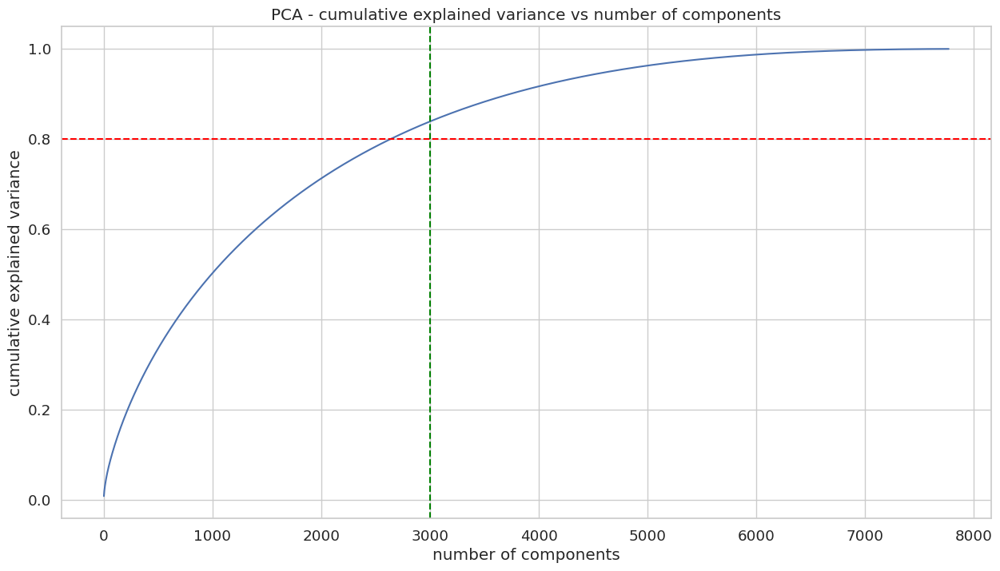

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(15,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

We observe that approximately 7500 components account for 100% of the variance. Furthermore, more than 80% of the variance can be attributed to just 3000 components. Therefore, to streamline the model and reduce dimensionality, we can select the top 3000 components, which will still capture more than 80% of the variance.

In [ ]:
# Reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [ ]:
# Transformed features
X = pca.transform(vector)

# Shape of transformed vectors
X.shape

(7770, 3000)

# **Clusters Implementation**

#### 1. K-Means Clustering

K-means clustering is an unsupervised machine learning technique designed to partition a dataset into a specified number of clusters. It's considered "unsupervised" because it doesn't rely on labeled examples for learning; instead, it leverages the inherent structure of the data to group samples into clusters.

Here's how it operates:
1.   Initially, K-means selects k random "centroids" or cluster centers from the dataset.
2.   It assigns each sample in the dataset to the nearest centroid based on a chosen distance metric, often Euclidean distance.
3.   The algorithm then updates the centroids by calculating the mean of the samples within each cluster.
4.   This process iteratively continues, with samples being reassigned to the nearest centroids and centroids being updated, until the algorithm converges.

In determining the optimal number of clusters for K-means, visualization tools like the elbow curve and Silhouette score are often employed to guide the selection process.

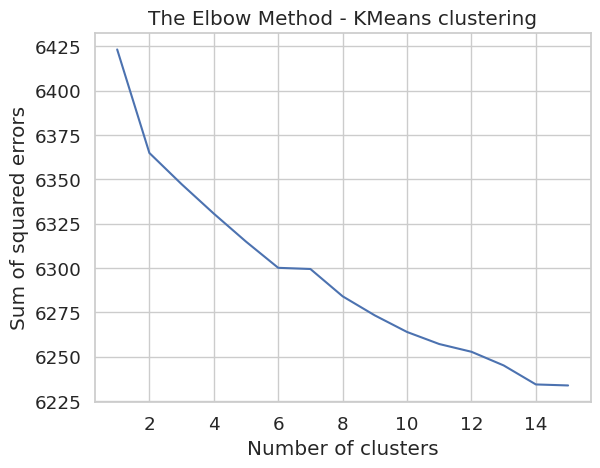

In [ ]:
#Elbow Method
'''Elbow method to find the optimal value of k'''

# Initialize a list to store the sum of squared errors for each value of k
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

As the number of clusters increases, the total sum of squared distances between each data point and its assigned cluster centroid decreases.

Text(0.5, 1.0, 'Silhouette analysis For Optimal k - KMeans clustering')

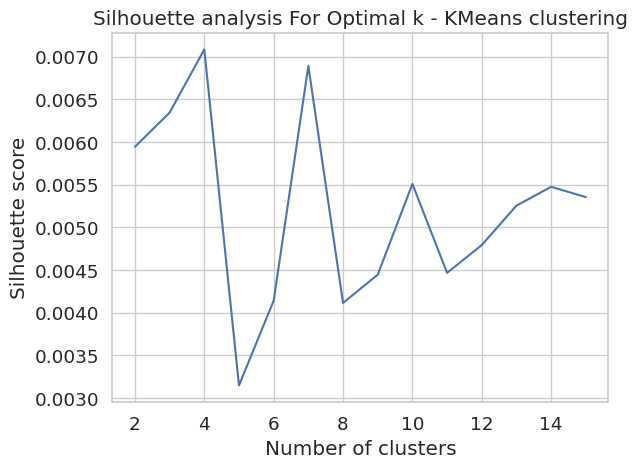

In [ ]:
#Silhoutte score method
'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')

The optimal number of clusters, as indicated by the highest Silhouette score, is 5.

**Creating 5 clusters through the utilization of the K-Means Clustering algorithm:**

In [ ]:
# Clustering the data into 5 clusters
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=33)
kmeans.fit(X)

# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)
print((kmeans_distortion, kmeans_silhouette_score))

(6319.119641642151, 0.0027654090079929214)


In [ ]:
# Adding a kmeans cluster number attribute
netflix_data['kmeans_cluster'] = kmeans.labels_

In [ ]:
# Printing Final Result
netflix_data.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
1654,Movie,Deadcon,Caryn Waechter,"Lauren Elizabeth, Claudia Sulewski, Keith Mach...",United States,TV-14,Horror Movies,"A group of uber-popular, social media influenc...",1
847,Movie,Bert Kreischer: Secret Time,Todd Biermann,Bert Kreischer,United States,TV-MA,Stand-Up Comedy,Shirtless comic Bert Kreischer relays personal...,1
6776,Movie,The Prince & Me,Martha Coolidge,"Julia Stiles, Luke Mably, Ben Miller, Miranda ...","United States, Czech Republic",PG,"Comedies, Romantic Movies",A hardworking Wisconsin college student falls ...,1
4005,Movie,Mea Culpa,"Raúl Campos, Jan Suter",Alexis de Anda,Mexico,TV-MA,Stand-Up Comedy,"Raw and outspoken, comedian Alexis de Anda bar...",1
3102,TV Show,Jack Whitehall: Travels with My Father,,"Jack Whitehall, Michael Whitehall",United Kingdom,TV-MA,"British TV Shows, Docuseries, International TV...",Jovial comic Jack Whitehall invites his stuffy...,4


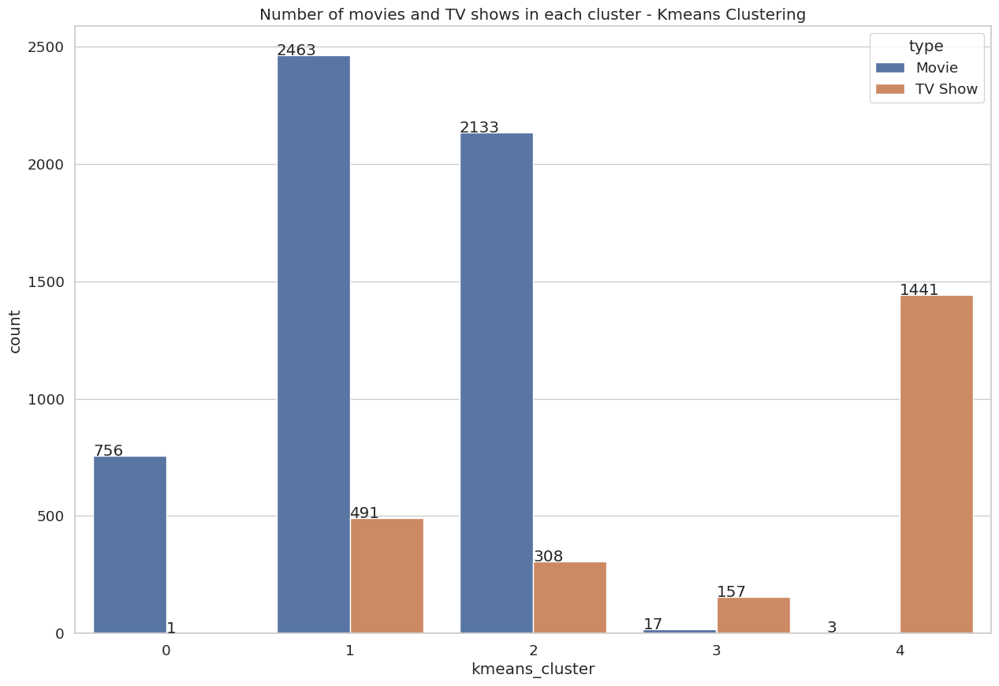

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(15,10))
graph = sns.countplot(x='kmeans_cluster',data=netflix_data, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# Adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

5 clusters have been successfully constructed using the K-Means Clustering algorithm.

**Generating word clouds for various clusters in K-Means Clustering**

In [ ]:
#Building wordclouds for different clusters in K-Means Clustering
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = netflix_data[['kmeans_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster']==cluster_number]

  # Text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # Create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Creating word clouds based on the "description" column for K-Mean clusters**

cluster 0


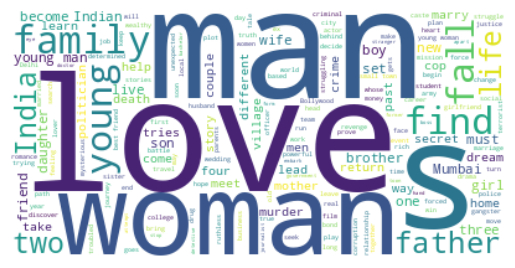

cluster 1


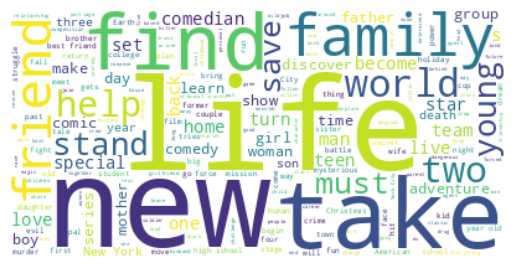

cluster 2


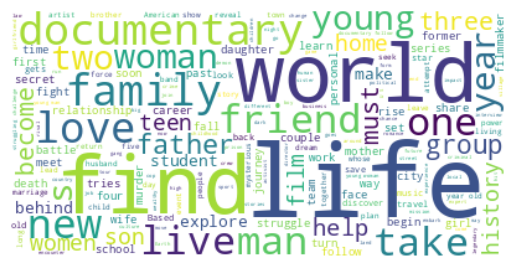

cluster 3


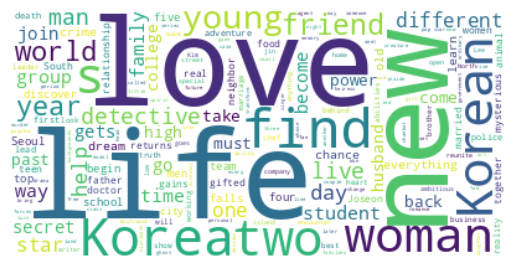

cluster 4


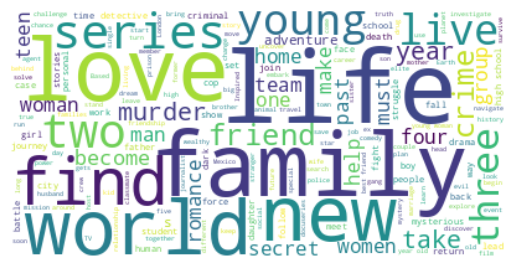

In [ ]:
# Word Cloud for Description column
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

 **Creating word clouds based on the "cast" column for K-Mean clusters**

cluster 0


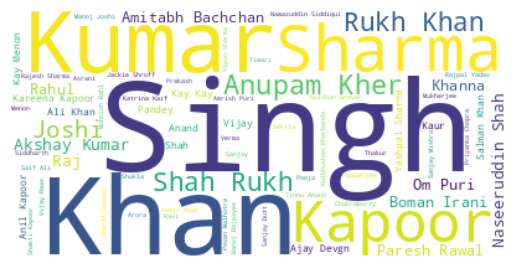

cluster 1


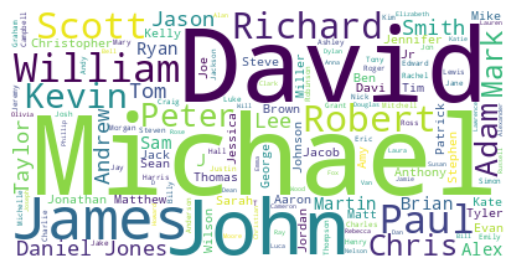

cluster 2


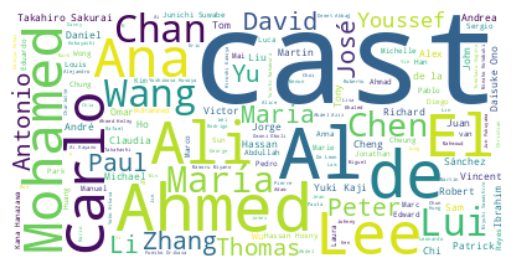

cluster 3


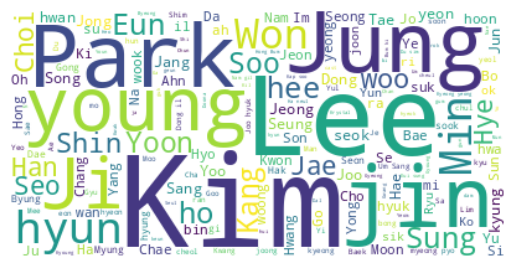

cluster 4


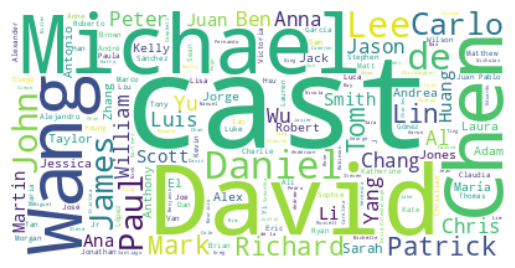

In [ ]:
# Word Cloud for Cast column
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

**Creating word clouds based on the "director" column for K-Mean clusters**

cluster 0


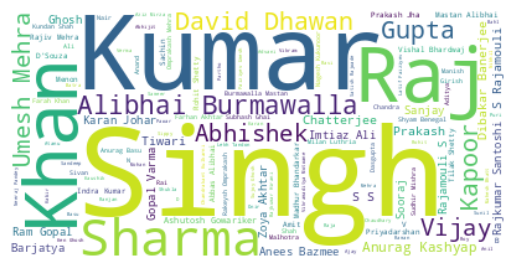

cluster 1


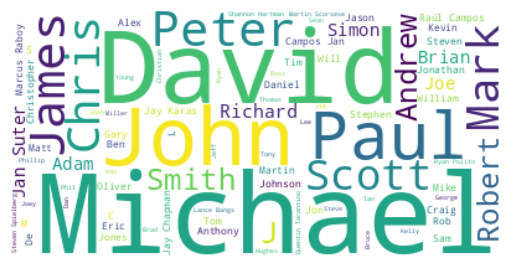

cluster 2


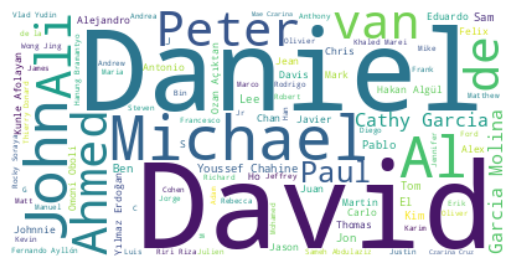

cluster 3


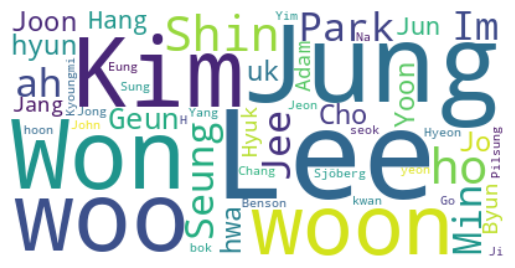

cluster 4


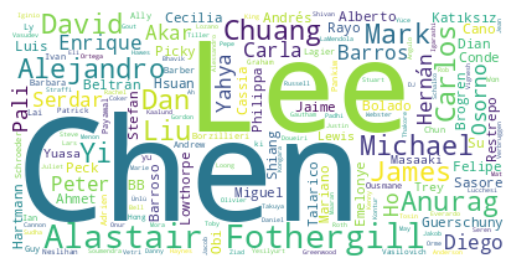

In [ ]:
# Word Cloud for Director column
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

**Creating word clouds based on the "listed_in" column for K-Mean clusters**

cluster 0


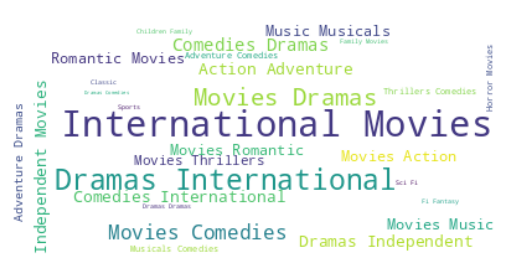

cluster 1


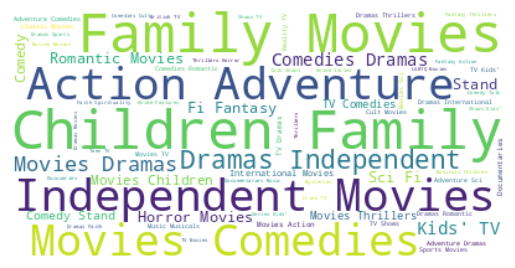

cluster 2


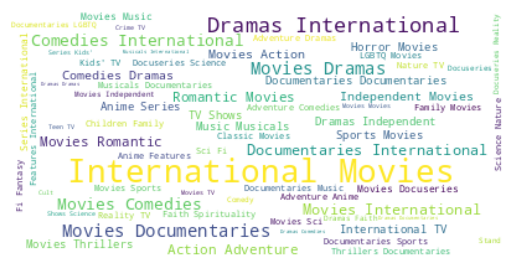

cluster 3


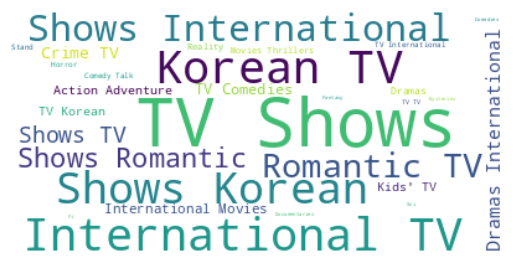

cluster 4


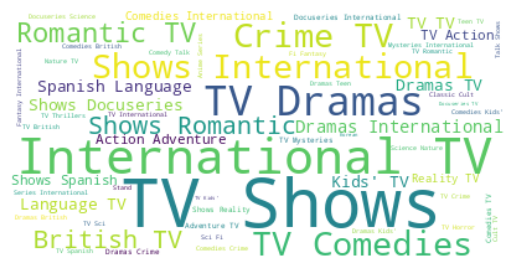

In [ ]:
# Word Cloud for listed_in column
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

**Creating word clouds based on the "country" column for K-Mean clusters**

cluster 0


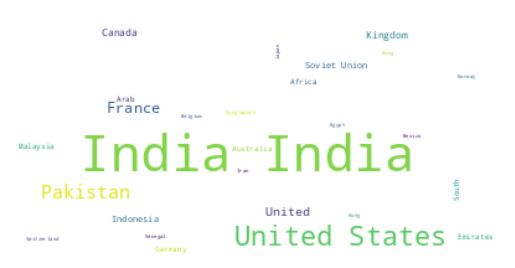

cluster 1


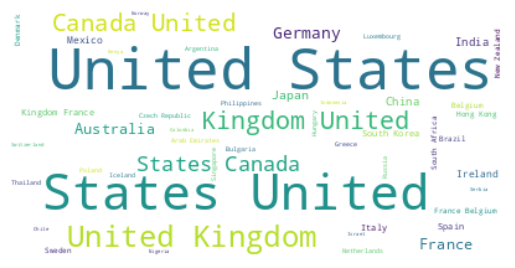

cluster 2


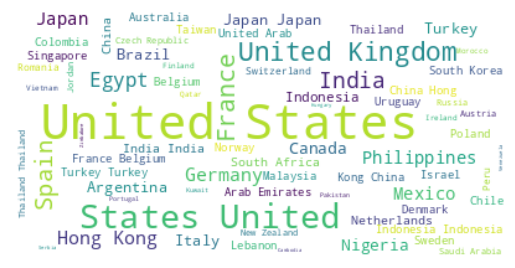

cluster 3


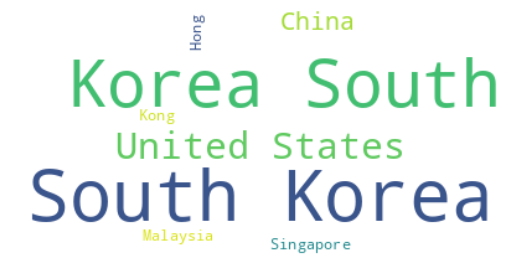

cluster 4


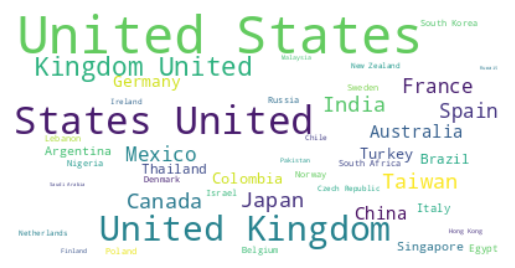

In [ ]:
# Word Cloud for Country column
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

**Creating word clouds based on the "title" column for K-Mean clusters**

cluster 0


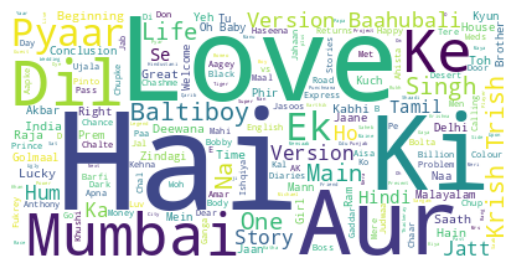

cluster 1


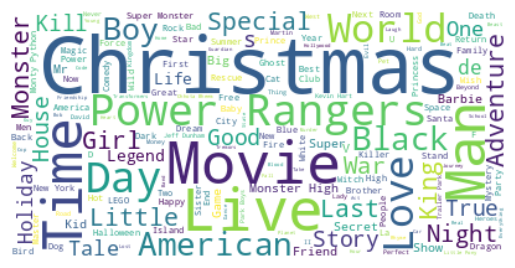

cluster 2


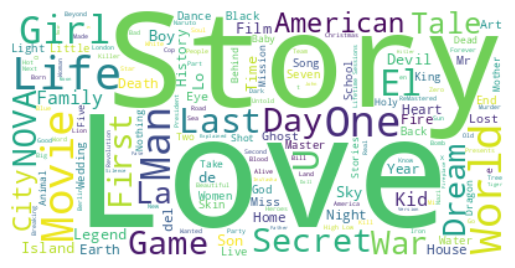

cluster 3


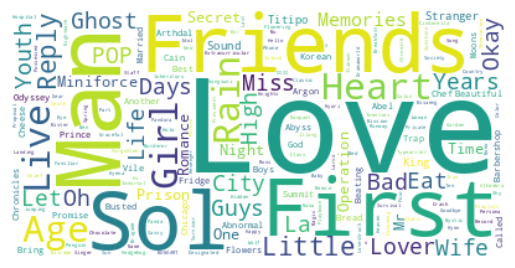

cluster 4


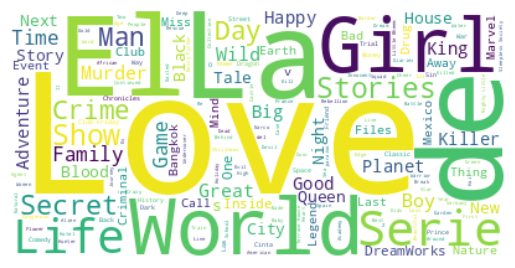

In [ ]:
# Word Cloud for Title column
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

#### 2. Hierarchical Clustering

After applying the agglomerative hierarchical clustering algorithm, a dendrogram is generated, representing a tree-like structure that illustrates the relationships between clusters at different hierarchy levels.

To identify the ideal number of clusters for our data, we can visually examine the dendrogram and seek the most substantial vertical gap that does not intersect any horizontal line. This gap represents the maximum dissimilarity between any two merged clusters.

We can then draw a horizontal line at this gap and count the number of vertical lines it crosses, which corresponds to the optimal number of clusters for our dataset.

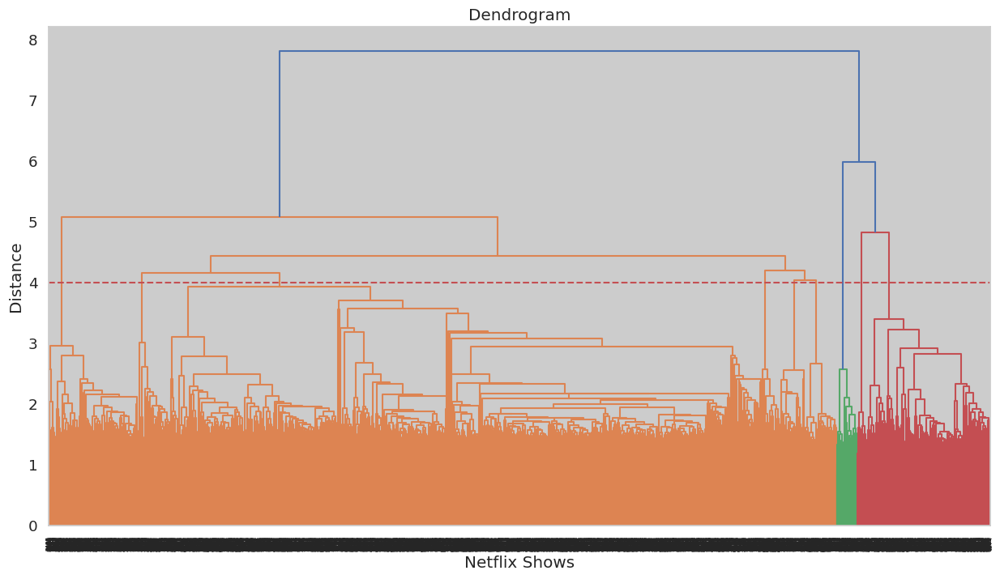

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(15, 8))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

With a distance of 4 units, the agglomerative clustering algorithm suggests forming 7 clusters.

**Creating 7 clusters through the utilization of the Agglomerative Clustering algorithm:**

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(X)

array([1, 1, 0, ..., 0, 1, 0])

In [ ]:
# Adding a hierarchical cluster number attribute
netflix_data['hierarchical_cluster'] = hierarchical.labels_
netflix_data.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
1294,Movie,Chatô: The King of Brazil,Guilherme Fontes,"Marco Ricca, Andrea Beltrão, Letícia Sabatella...",Brazil,TV-MA,"Dramas, International Movies",The romanticized life of media mogul Assis Cha...,0
1608,TV Show,Dare Me,,"Willa Fitzgerald, Herizen Guardiola, Marlo Kel...",United States,TV-MA,"Crime TV Shows, TV Dramas, TV Thrillers",Relationships topple and loyalties flip when a...,1
1468,Movie,Come and Find Me,Zack Whedon,"Aaron Paul, Annabelle Wallis, Garret Dillahunt...","Canada, United States, United Kingdom",R,"Dramas, Thrillers","When his photographer girlfriend vanishes, an ...",0
1293,Movie,Chasing Trane,John Scheinfeld,"Denzel Washington, Bill Clinton, Ravi Coltrane...",United States,TV-PG,"Documentaries, Music & Musicals","Featuring interviews, insights and archival fo...",0
5598,TV Show,Sid the Science Kid,,"Drew Massey, Julianne Buescher, Victor Yerrid,...",United States,TV-Y,Kids' TV,Armed with a healthy sense of humor and the he...,0


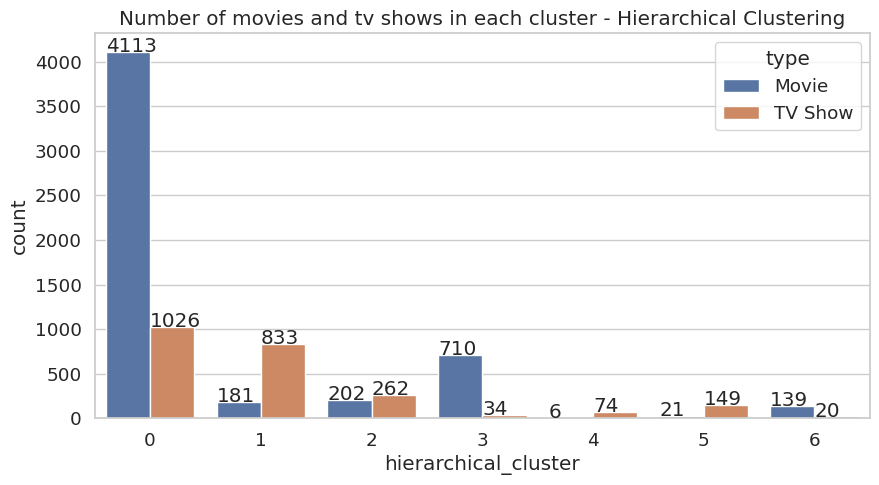

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=netflix_data, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# Adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

7 clusters have been successfully constructed using the Agglomerative (Hierarchical) Clustering algorithm.

**Generating word clouds for various clusters in Hierarchical Clustering**

In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = netflix_data[['hierarchical_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster']==cluster_number]

  # Text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # Create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Creating word clouds based on the "title" column for Hierarchical clusters**

cluster 0


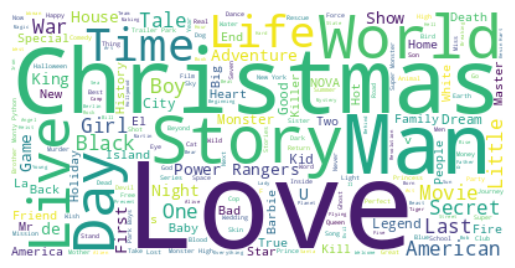

cluster 1


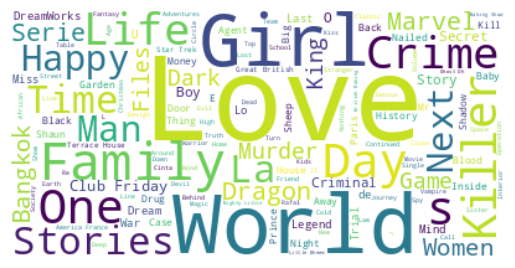

cluster 2


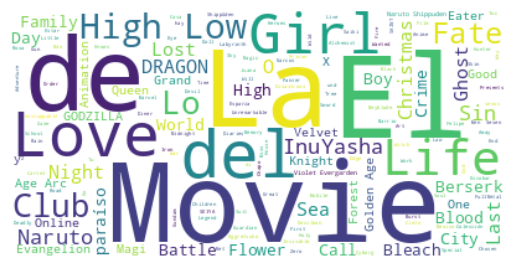

cluster 3


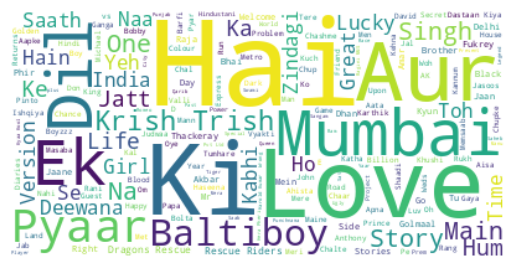

cluster 4


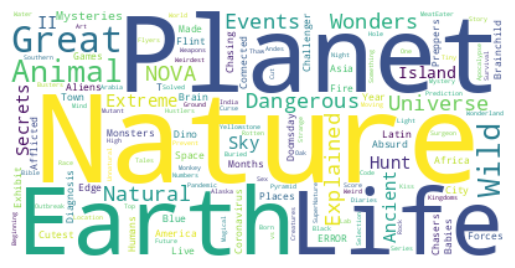

cluster 5


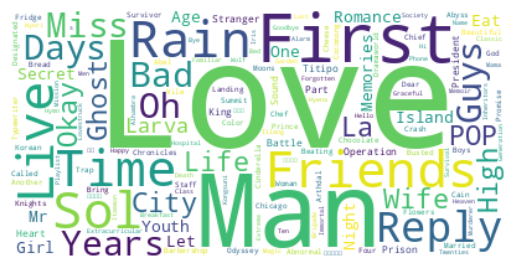

cluster 6


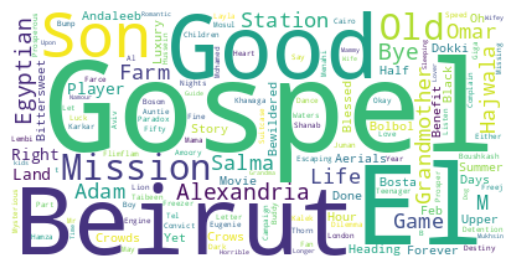

In [ ]:
# Word Cloud for Title column
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

**Creating word clouds based on the "description" column for Hierarchical clusters**

cluster 0


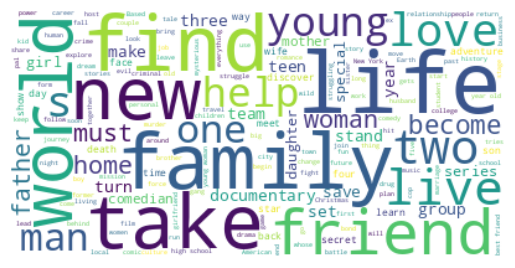

cluster 1


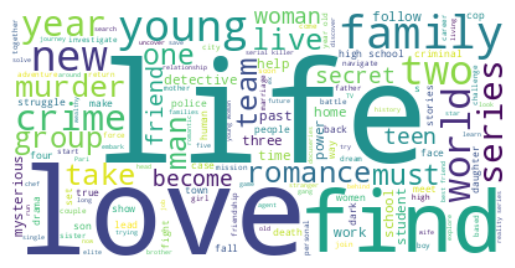

cluster 2


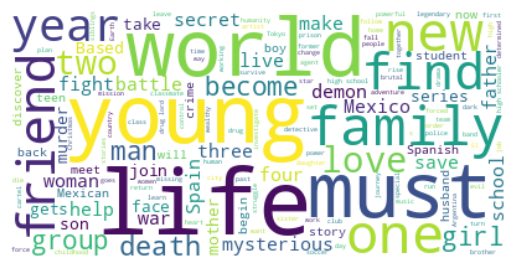

cluster 3


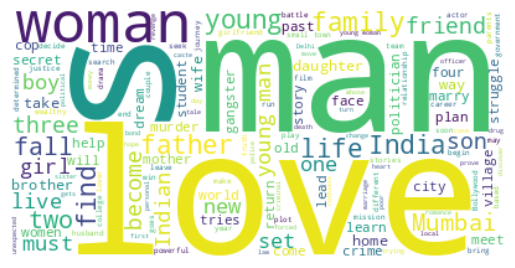

cluster 4


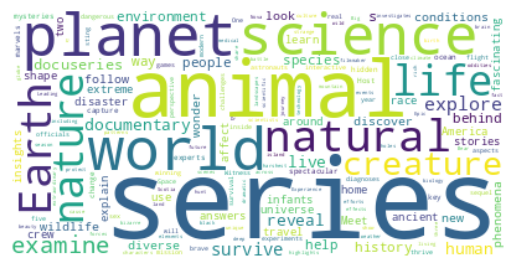

cluster 5


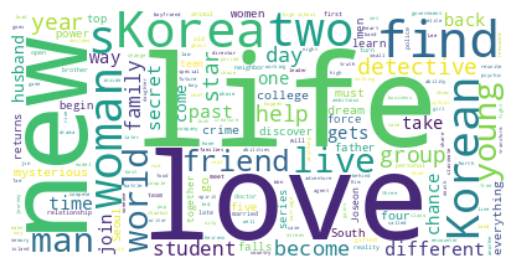

cluster 6


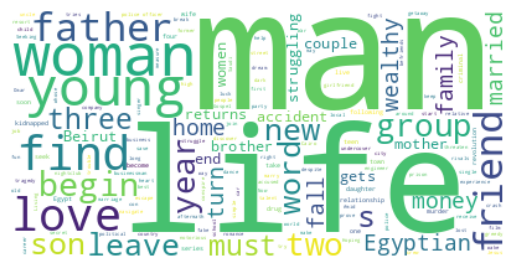

In [ ]:
# Word Cloud for Description column
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

**Creating word clouds based on the "cast" column for Hierarchical clusters**

cluster 0


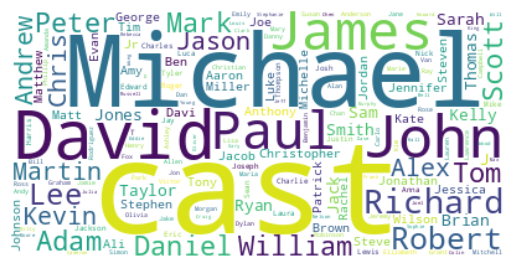

cluster 1


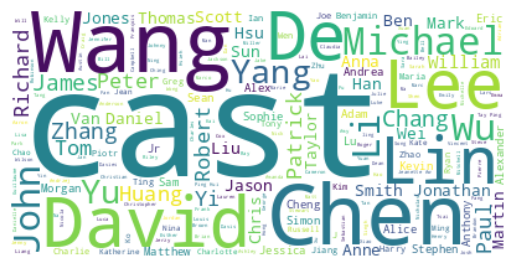

cluster 2


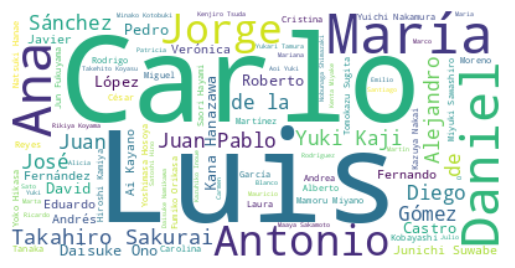

cluster 3


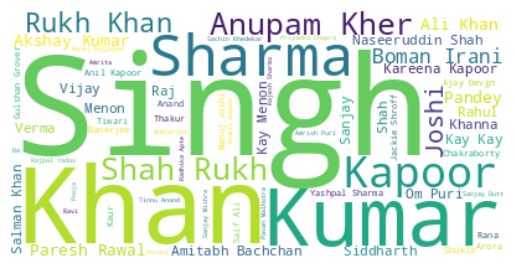

cluster 4


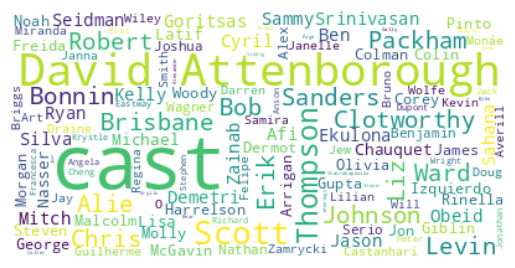

cluster 5


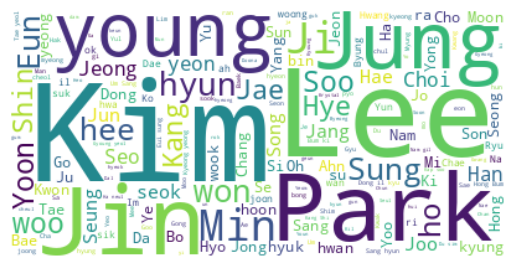

cluster 6


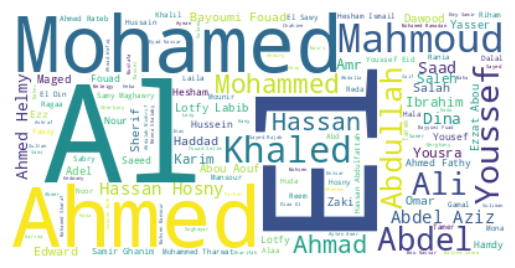

In [ ]:
# Word Cloud for Cast column
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

**Creating word clouds based on the "country" column for Hierarchical clusters**

cluster 0


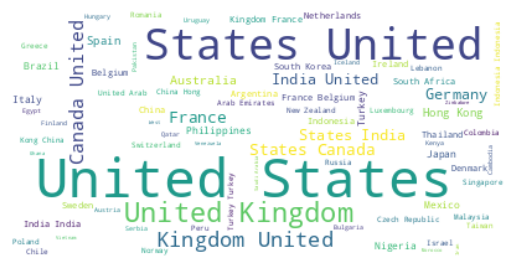

cluster 1


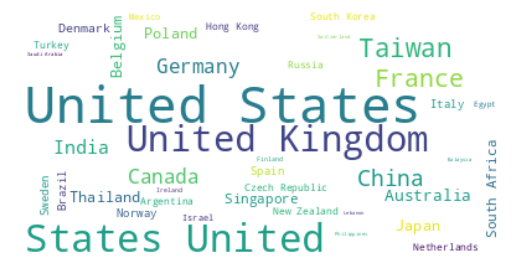

cluster 2


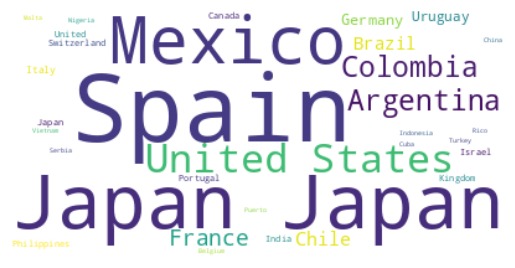

cluster 3


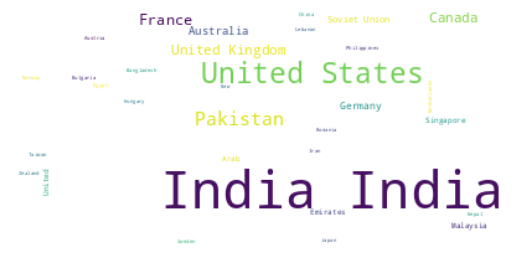

cluster 4


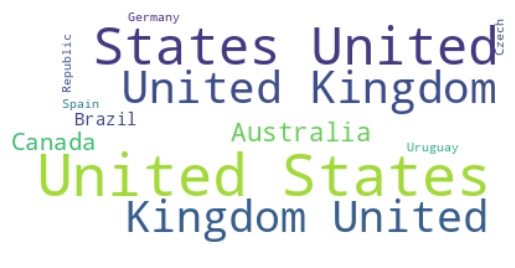

cluster 5


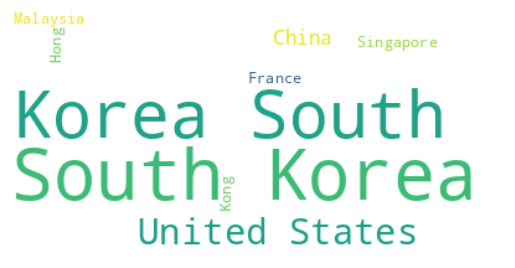

cluster 6


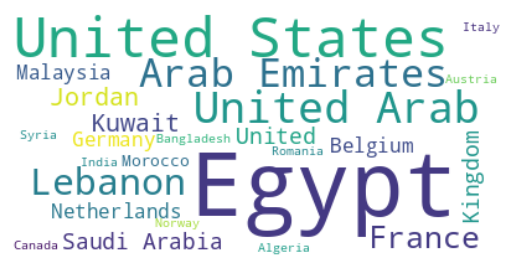

In [ ]:
# Word Cloud for Country column
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

**Creating word clouds based on the "listed_in" column for Hierarchical clusters**

cluster 0


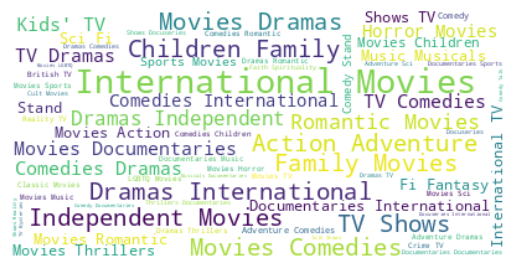

cluster 1


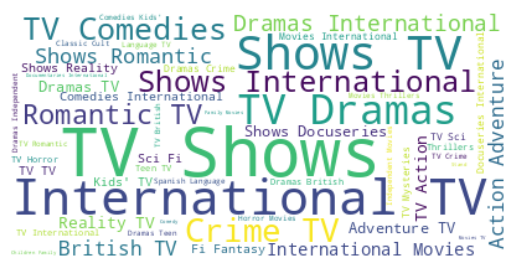

cluster 2


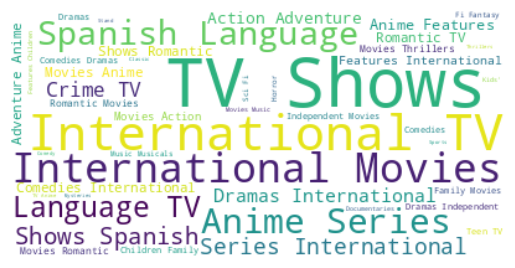

cluster 3


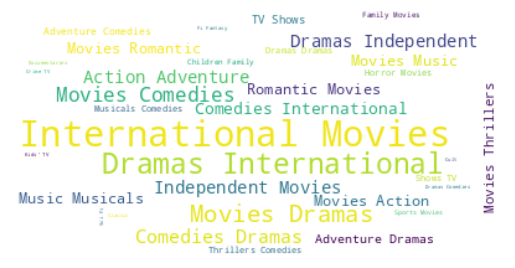

cluster 4


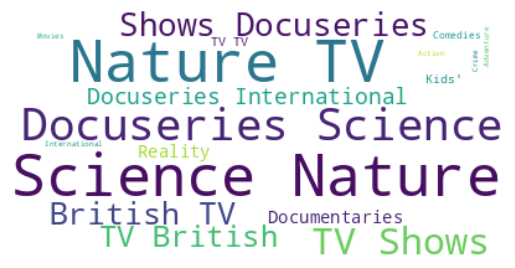

cluster 5


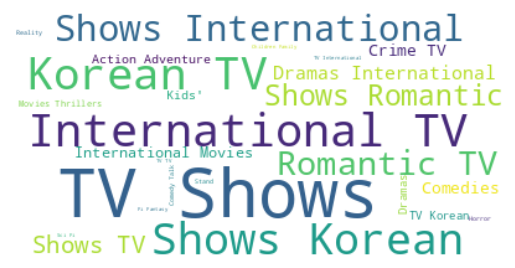

cluster 6


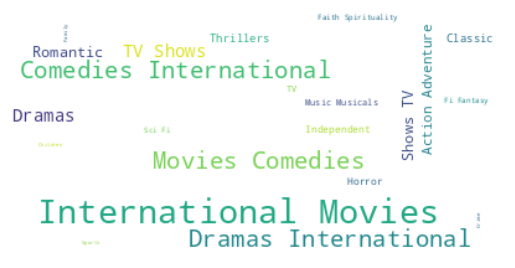

In [ ]:
# Word Cloud for listed_in column
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

# **Content Based Recommendation System**

A content-based recommendation system suggests items to users by assessing the similarity of those items. This system offers product or item recommendations based on their descriptions or characteristics and determines how similar these items are based on their descriptions.

In essence, it keeps track of which items a particular user has shown interest in and identifies items that users with similar preferences and behaviors have also liked. This enables the system to provide recommendations tailored to that user.

We can create a straightforward content-based recommendation system by evaluating the similarity between movies or shows. For instance, if a user has watched a show on Netflix, the recommender system should be capable of suggesting a list of similar shows that align with the user's preferences. To measure the similarity between shows, we can employ cosine similarity.

Cosine similarity calculates the similarity score between two vectors (A and B) by taking the dot product of the two vectors and dividing it by their magnitude values. In simpler terms, the cosine similarity score increases as the angle between the two vectors decreases.

In [ ]:
# Verifying index
netflix_data[['show_id', 'title', 'tags']]

,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7782,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7783,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7784,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7785,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


1.   Although the original dataframe contains 7770 rows, after the removal of rows with null values, the last index displayed in the dataframe appears as 7786.
2.   When constructing a content-based recommendation system, we calculate similarity scores based on a specific index_id relative to the corresponding "tags" column.
3.   Failing to reset the index could potentially result in the computation of cosine similarity for a different index, introducing inaccuracies into the recommendations. Therefore, resetting the index becomes imperative to ensure that the recommendations are associated with the correct index.
4.   Resetting the index essentially involves assigning a new sequential index to each row in the dataframe, commencing from 0. This process guarantees that each row possesses a unique and distinguishable index, facilitating computations and yielding precise outcomes.
5.   Consequently, resetting the index stands as a pivotal step in the development of a content-based recommendation system, guaranteeing the accuracy and relevance of the recommendations by aligning them with the correct index.

In [ ]:
# Defining new dataframe for building recommandation system
recommender_df = netflix_data.copy()

# Reseting index
recommender_df.reset_index(inplace=True)

# Checking whether or not reset index properly
recommender_df[['show_id', 'title', 'tags']]

,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7765,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7766,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7767,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7768,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


As illustrated in the dataframe above, we have effectively reset the index. This means that the dataset is now prepared and primed for the construction of a content-based recommendation system.

In [ ]:
# Dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

# Setting index
print(f"before reset index id for movie 'Zero' : {netflix_data[netflix_data['title'] == 'Zero'].index[0]}")  # index[0] --> to locate index position
print(f"after reset index id for movie 'Zero': {recommender_df[recommender_df['title'] == 'Zero'].index[0]}")

before reset index id for movie 'Zero' : 7764
after reset index id for movie 'Zero': 7747


In [ ]:
# Calling out transformed array independent features created from tags(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 1.62770754e-01, -8.85380780e-03, -2.34244239e-02, ...,
         5.46237532e-03,  1.05890165e-04,  5.81973023e-03],
       [-4.51876579e-02, -9.27064344e-03,  1.31688188e-02, ...,
        -1.78595497e-03,  6.81948488e-03,  1.12747734e-03],
       [-4.39819888e-02, -4.74207488e-02, -3.34881492e-02, ...,
        -2.90471751e-04,  4.38134436e-03, -4.50691292e-03],
       ...,
       [-6.50688501e-02,  3.12716726e-02,  8.85613566e-02, ...,
         1.97491349e-02,  9.87748305e-04,  4.93552960e-03],
       [ 7.57150814e-02,  4.35981475e-02,  2.25945606e-02, ...,
        -8.96760576e-03,  1.23094066e-02, -1.03567519e-02],
       [-5.65400850e-02,  1.72672124e-01,  1.38299413e-01, ...,
        -5.78803565e-03, -7.40427943e-03, -2.68350735e-03]])

In [ ]:
# Calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.08776614,  0.02326954, ..., -0.02524384,
         0.01094016, -0.02184533],
       [ 0.08776614,  1.        , -0.00430122, ...,  0.06972763,
        -0.00983306, -0.00915573],
       [ 0.02326954, -0.00430122,  1.        , ..., -0.00201134,
        -0.01135075, -0.01246755],
       ...,
       [-0.02524384,  0.06972763, -0.00201134, ...,  1.        ,
        -0.01505418,  0.05308061],
       [ 0.01094016, -0.00983306, -0.01135075, ..., -0.01505418,
         1.        ,  0.04592587],
       [-0.02184533, -0.00915573, -0.01246755, ...,  0.05308061,
         0.04592587,  1.        ]])

**Function to Generate a List of the Top 10 Recommended Movies Based on Cosine Similarity Scores**

In [ ]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # Find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # Sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # Listing top ten recommenaded movie
    for i in distances[1:11]:
        print(netflix_data.iloc[i[0]].title)

In [ ]:
recommend('Naruto')

If you liked 'Naruto', you may also enjoy: 

Naruto Shippûden the Movie: Bonds
Naruto Shippuden: The Movie
Naruto Shippuden : Blood Prison
Naruto the Movie 2: Legend of the Stone of Gelel
Naruto Shippûden the Movie: The Will of Fire
Naruto the Movie 3: Guardians of the Crescent Moon Kingdom
Naruto Shippuden: The Movie: The Lost Tower
DRIFTING DRAGONS
Dino Girl Gauko
Marvel Anime: Wolverine


In [ ]:
recommend('Our Planet')

If you liked 'Our Planet', you may also enjoy: 

Nature's Great Events: Diaries
Nature's Great Events (2009)
Nature's Weirdest Events
Blue Planet II
Planet Earth II
The Making of Frozen Planet
Life Story
Night on Earth
The Hunt
Moving Art


In [ ]:
recommend('Phir Hera Pheri')

If you liked 'Phir Hera Pheri', you may also enjoy: 

Bhool Bhulaiyaa
Thank You
Golmaal: Fun Unlimited
Bhagam Bhag
Ready
Chup Chup Ke
Khushi
Life in a ... Metro
Hattrick
Hasee Toh Phasee


In [ ]:
recommend('Golmaal: Fun Unlimited')

If you liked 'Golmaal: Fun Unlimited', you may also enjoy: 

Golmaal Returns
Phir Hera Pheri
Himmatwala
Hattrick
Maine Pyaar Kyun Kiya
Ishqiya
C Kkompany
Thank You
Chup Chup Ke
Bewafaa


As you can see above it is ready to use and it suggests the similar movies which you may like if you have watched the current movie.

# **Conclusion**

In conclusion, our exploration of Netflix's vast library of shows has been both engaging and informative. We successfully employed clustering techniques and created a content-based recommender system that takes into account various attributes such as director, cast, country, genre, rating, and description.

* With a dataset comprising over 7,787 records and 12 attributes, we started by addressing missing values in the dataset. Null values in the 'cast' column were replaced with 'No cast,' and missing values in the 'country' column were filled with the mode of the column. Rows with null values in the 'date_added' and 'rating' columns were removed to ensure data integrity. We also made a data-driven decision to drop the 'director' column due to its limited relevance for our analysis.

* During EDA, we uncovered several important insights. Notably, Netflix offers a more extensive selection of movies compared to TV shows. This foundational information can guide decision-making regarding content acquisition and production. We also observed that TV-MA is the most prevalent rating for both movies and TV shows, emphasizing Netflix's focus on mature content. Insights into release years and months highlighted trends in content production and added strategic value for content planning.

* We conducted hypothesis tests to validate specific claims. For instance, we tested whether the average number of movies on Netflix in the United States is greater than in India. Additionally, we examined if there is a significant difference in the number of movies and TV shows added across different months and whether the number of movies on Netflix is significantly greater than the number of TV shows. These tests provided statistical support for our hypotheses.

* To handle the challenge of high dimensionality, we transformed key attributes into a 10,000-feature TF-IDF vectorization and utilized Principal Component Analysis (PCA) to reduce dimensions to 3,000 while retaining more than 80% of the variance.

* We applied both K-Means and Agglomerative clustering algorithms to group similar content based on text-based features. K-Means suggested 5 clusters, while Agglomerative clustering suggested 7 clusters. These clusters can be valuable for personalized content recommendations and content management.
But our journey didn't stop there. We proceeded to develop a content-based recommender system that leverages the cosine similarity matrix. This system delivers personalized recommendations tailored to a user's viewing history, offering a curated list of 10 outstanding shows for further exploration.

* We developed a content-based recommendation system that utilizes cosine similarity to suggest similar content to users based on their preferences. This system empowers users with personalized recommendations, enhancing their content discovery experience. Come and immerse yourself in the diverse world of Netflix shows, and let our recommender system be your trusted guide, leading you to your next binge-worthy obsession.

In conclusion, our project has shed light on various aspects of Netflix's content strategy. By understanding content availability, ratings, release patterns, genres, and utilizing advanced techniques like clustering and recommendation systems, Netflix can make informed decisions to meet user preferences, attract and retain subscribers, and navigate the ever-evolving landscape of the streaming industry. Continuous adaptation and data-driven strategies are essential for Netflix's sustained growth and success in this competitive arena.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***